# 1. INTRODUÇÃO

![Imagem](https://portal.fiocruz.br/sites/agencia.fiocruz.br/files/u34/concurso2023_m.jpg)

Conforme relatado pela Fundação Oswaldo Cruz em seu portal de notícias, na reunião extraordinária realizada no dia 2 de novembro de 2023, membros do Conselho Deliberativo da Fiocruz aprovaram por unanimidade o quadro geral de distribuição de vagas por unidade e por cargo para o Concurso Fiocruz 2023. Ao todo, o Ministério da Gestão e Inovação havia autorizada 300 vagas para o concurso da Fiocruz, sendo 100 para cada um dos seguintes cargos:

- Analista de gestão em saúde;
- Pesquisador em saúde pública; e
- Tecnologista em saúde pública.

Todas as carreiras eram destinadas a quem tem o nível superior completo.

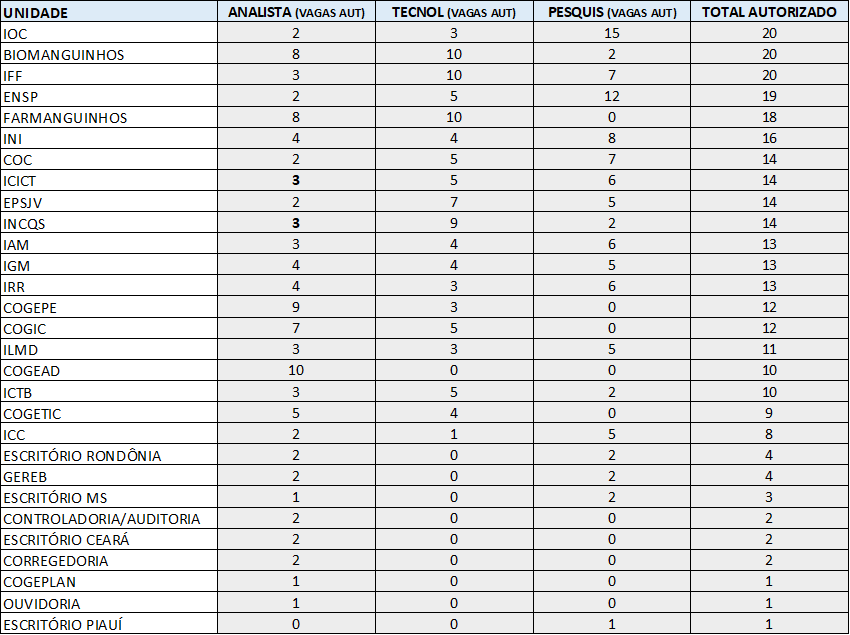

Fonte: https://portal.fiocruz.br/noticia/conselho-deliberativo-aprova-quadro-geral-de-vagas-para-o-concurso-2023

A distribuição de vagas apresentada ao Conselho pelo diretor-executivo considerou critérios já aprovados pelo CD, como reposição de cargos por aposentadorias, missão de cada unidade, contextos locais, desafios atuais e futuros da instituição, fortalecimento do Sistema de Integridade, incremento das coordenações-gerais, por atenderem à toda Fiocruz, gestão de aquisições e contrários e reforço nas unidades regionais. Considerando o baixo número de vagas disponíveis para esse concurso, a Presidência também optou por priorizar as vagas para o Sistema de Integridade e para as coordenações gerais da Diretoria Executiva, e priorização máxima das unidades técnico-científicas.

**Critérios gerais para distribuição por cargo**

Para todos os cargos foram consideradas as seguintes variáveis pela proposta da Presidência: evolução da força de trabalho entre 2013 e 2022; composição da força de trabalho por cargo; aderência dos perfis às diretrizes do CD e prioridades estabelecidas pelas direções.

Já para a distribuição das vagas para o cargo de analista, além da priorização das áreas de gestão de aquisições e contratos, também foram incluídos critérios adicionais, como a distribuição percentual dos analistas por unidade, pela força total de trabalho e pelo volume orçamentário manejado por cada unidade.

Além disso, das 1.300 vagas que foram demandadas pelas unidades, quase 900 foram consideradas prioritárias pelos diretores e foram analisadas pela comissão do concurso e pela presidência.


# EDITAIS

O concurso incluiu mecanismos voltados para os processos de inclusão e medidas de acessibilidade, tanto das pessoas  negras quanto das pessoas com deficiência: o edital garantia 20% do total de vagas para pessoas negras, mediante procedimento de heteroidentificação, complementar à autodeclaração.

Outros 5% do total são reservados para pessoas com deficiência (PcD) que se enquadrarem na legislação pertinente. Estes candidatos tinham asseguradas condições adequadas para fazer as provas e se fossem classificados nas provas objetivas e discursivas, passar por avaliação biopsicossocial.

## Cargo de Pesquisador em Saúde Pública

O  Concurso Público destinava-se a selecionar candidatos para o
provimento de **100** (cem) vagas, sendo **75** (setenta e cinco) vagas de ampla concorrência, **20** (vinte) vagas reservadas para pessoas negras e **5** (cinco) vagas reservadas para pessoas com deficiência para a classe inicial do **Cargo de Pesquisador em Saúde Pública, na carreira de Gestão em Ciência, Tecnologia, Produção e Inovação em Saúde Pública**.

* Edital disponível em: https://concurso2023.fiotec.fiocruz.br/Divulgacao/Edital-Fiocruz-2023-Pesquisador.pdf

Para todos os perfis:

 - **1ª etapa**: Prova Discursiva, eliminatória e classificatória;
 - **2ª etapa**: Análise de Títulos, classificatória;
 - **3ª etapa**: Apresentação do Projeto de Atuação Profissional e Defesa de Memorial, eliminatória e
classificatória


# CONJUNTO DE DADOS

 O conjunto de dados apresentados referem-se aos resultados finais relacionados aos cargos do Concurso Público.

### Cargo de Tecnologista em Gestão em Saúde

**Resultado final da Prova Objetiva**:

* Disponível em: https://concurso2023.fiotec.fiocruz.br/Pesquisador.asp

# BIBLIOTECAS E MÓDULOS

In [1]:
# Bibliotecas Padrão
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from scipy import stats

from datetime import datetime

import warnings
warnings.filterwarnings("ignore")
#warnings.filterwarnings("ignore", category = DeprecationWarning)

In [2]:
print("python:", sys.version)
print("pandas:", pd.__version__)
print("numpy:", np.__version__)
print("seaborn:", sns.__version__)

python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
pandas: 2.0.3
numpy: 1.25.2
seaborn: 0.13.1


##Funções de apoio

In [3]:
# Função de resumo
def resumetable(dataset):
    summary = pd.DataFrame(dataset.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = dataset.isnull().sum().values
    summary['Uniques'] = dataset.nunique().values
    summary['First Value'] = dataset.loc[0].values

    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = round(stats.entropy(dataset[name].
                                                                              value_counts(normalize=True), base=2),2)

    return summary

# Função para verificar os tipos de dados de todas as colunas:
def shape_datatypes(dataset):
    print("Qtde de linhas:",len(dataset))
    print("Qtde de colunas:",len(dataset.columns))
    return dataset.head()

# Função para verificar os tipos de dados de todas as colunas:
def check_datatypes(dataset):
    return dataset.dtypes

# Proporção (em %) de valores nulos existentes
def value_null(dataset):
    null_values = (dataset.isnull().sum()/len(dataset))*100
    null_values = pd.DataFrame(null_values, columns=['% de valores nulos'])
    return null_values

# Identificar linhas duplicadas com base em todas as colunas
def duplicates(dataset):
  duplicates = dataset[dataset.duplicated()]
  return duplicates

In [4]:
def single_countplot(df, ax, x=None, y=None, top=None, order=True, hue=False, palette='gist_earth',
                     width=0.75, sub_width=0.3, sub_size=2):

    # Verificando a plotagem e quebrando algumas variáveis ​​​​categóricas
    ncount = len(df)
    if x:
        col = x
    else:
        col = y

    # Classifique o eixo x por valores de timestamp
    if x and order:
        if df[x].dtype == 'datetime64[ns]':
            df = df.sort_values(by=x)

    # Plotar as variáveis categóricas
    if top is not None:
        cat_count = df[col].value_counts()
        top_categories = cat_count[:top].index
        df = df[df[col].isin(top_categories)]

    # Validar argumentos e criar o gráfico
    if hue != False:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax,
                          order=df[col].value_counts().sort_index().index, hue=hue)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, hue=hue)
    else:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax,
                          order=df[col].value_counts().sort_index().index)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax)

    # Adicionar percentagem ao label
    if x:
        for p in ax.patches:
            x = p.get_bbox().get_points()[:, 0]
            y = p.get_bbox().get_points()[1, 1]
            ax.annotate('{}\n{:.1f}%'.format(int(y), 100. * y / ncount), (x.mean(), y), ha='center', va='bottom', fontsize=8)
    else:
        for p in ax.patches:
            x = p.get_bbox().get_points()[1, 0]
            y = p.get_bbox().get_points()[:, 1]
            ax.annotate('{} ({:.1f}%)'.format(int(x), 100. * x / ncount), (x, y.mean()), va='center', fontsize=8)

In [5]:
# Função de número de valores exclusivos em cada recurso
def value_features(dataframe):
  plt.figure(figsize=(15,5))
  ax = sns.barplot(x=dataframe.columns, y=dataframe.nunique().values,
            palette='RdBu_r', linewidth=1.5, edgecolor='black')
  plt.xticks(rotation=90, fontsize=12)
  for p in ax.patches:
    value = f"{p.get_height():,.0f}"
    x = p.get_x() + p.get_width()/2
    y = p.get_height() + 20
    ax.text(x, y, value, fontsize=12, ha='center', va='center', weight='bold',
           bbox=dict(facecolor='white', boxstyle='round', linewidth=1, edgecolor='k'))
  plt.suptitle(t = '\nNúmero de valores exclusivos em cada recurso\n', fontsize = 16, weight = 'bold')
  sns.despine()
  plt.show()

In [6]:
def plot_cargo_status(df, column='cargo'):
    # Obter valores únicos da coluna 'cargo'
    cargos_unicos = df[column].unique()

    # Calcular o número de linhas necessárias
    num_linhas = (len(cargos_unicos) - 1) // 10 + 1

    fig, axs = plt.subplots(num_linhas, 10, figsize=(30, 6*num_linhas))

    # Iterar sobre os valores únicos de 'cargo' e criar os gráficos
    for i, cargo in enumerate(cargos_unicos):
        linha = i // 10
        coluna = i % 10

        df_cargo = df[df[column] == cargo]
        cargo_status_counts = df_cargo['status'].value_counts()

        axs[linha, coluna].bar(cargo_status_counts.index, cargo_status_counts.values, color='skyblue')
        axs[linha, coluna].set_title(f'Cargo {cargo} \n')
        axs[linha, coluna].tick_params(axis='x', rotation=90)  # Rotacionar rótulos do eixo x em 90 graus
        axs[linha, coluna].set_xlabel('\nStatus', size=9)
        axs[linha, coluna].set_ylabel('Total\n', size=9)

        # Adicionar valores e percentuais acima de cada coluna
        for j, valor in enumerate(cargo_status_counts.values):
            percentual = valor / cargo_status_counts.sum() * 100
            cor = 'darkgreen' if j == 0 else 'darkred'  # Definir cor diferente para valores e percentuais
            axs[linha, coluna].text(j, valor + 0.7, f'{valor}\n({percentual:.2f}%)', ha='center', color=cor)

    # Remover subplots não utilizados, se houver
    for i in range(len(cargos_unicos), num_linhas * 10):
        linha = i // 10
        coluna = i % 10
        fig.delaxes(axs[linha, coluna])

    # Ajustar layout e exibir os subplots
    plt.tight_layout()
    plt.show()

In [7]:
def count_plot(feature, df, title, xlabel, ylabel):
    sns.set(style="whitegrid")
    ax = sns.countplot(x=feature, data=df, palette="Set2")
    plt.title(title, fontsize=12)
    plt.xlabel(xlabel, fontsize=10)
    plt.ylabel(ylabel, fontsize=10)

    # Adicionando valores totais acima das barras
    total_count = len(df)
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}\n({p.get_height() / total_count:.1%})',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=8, color='black', xytext=(0, 10),
                    textcoords='offset points')

    plt.xticks(fontsize=9)
    plt.yticks(fontsize=9)
    plt.show()

In [8]:
def plotar_notas_aprovados(df, coluna):
    # Filtrando o DataFrame para incluir apenas os candidatos aprovados
    aprovados = df[df['situacao_status'] == 'aprovado']

    # Encontrando a menor e a maior nota para cada cargo entre os candidatos aprovados
    menor_nota_por_cargo = aprovados.groupby('cargo')[coluna].min()
    maior_nota_por_cargo = aprovados.groupby('cargo')[coluna].max()

    # Criando o gráfico de barras
    plt.figure(figsize=(25, 8))

    # Plotando as menores notas por cargo
    menor_nota_por_cargo.plot(kind='bar', color='skyblue', position=0, width=0.4, label='Menor Nota')

    # Plotando as maiores notas por cargo
    maior_nota_por_cargo.plot(kind='bar', color='orange', position=1, width=0.4, label='Maior Nota')

    # Adicionando os valores acima das barras para as menores notas
    for i, v in enumerate(menor_nota_por_cargo):
        plt.text(i + 0.2, v + 0.1, str(v), ha='center', va='bottom')

    # Adicionando os valores acima das barras para as maiores notas
    for i, v in enumerate(maior_nota_por_cargo):
        plt.text(i - 0.2, v + 0.1, str(v), ha='center', va='bottom')

    plt.title(f'Menor e Maior nota por cargo dentre os candidatos aprovados ({coluna})\n')
    plt.xlabel('\nCargo')
    plt.ylabel('Nota\n')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [9]:
def plot_top_n_cargos(df, n, title, ascending=True):
    order_percent = df.groupby('cargo')['situacao_status'].apply(lambda x: (x == 'aprovado').mean() * 100)
    if ascending:
        top_n_cargos = order_percent.nsmallest(n)
    else:
        top_n_cargos = order_percent.nlargest(n)

    plt.figure(figsize=(10, 6))
    colors = plt.cm.viridis(np.linspace(0, 1, len(top_n_cargos)))
    top_n_cargos.plot(kind='bar', color=colors)

    for i, v in enumerate(top_n_cargos):
        plt.text(i, v + 1 if ascending else v + 0.5, f'{v:.2f}%', ha='center', va='bottom')

    plt.title(f'{title}\n')
    plt.xlabel('\nCargos')
    plt.ylabel('Percentual de aprovação\n')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# CARGA DOS DADOS

 O upload de arquivos para o Google Colab pode ser feito de algumas maneiras diferentes, de acordo com a linguagem usada. Os métodos mais comuns para fazer upload de arquivos para o Google Colab são apresentados a seguir.

1. **Upload manual de arquivos**:

- Clique no ícone da pasta na barra lateral esquerda.
- Clique no botão "Upload" e selecione o arquivo que deseja fazer upload.
- Aguarde até que o upload seja concluído.

   O arquivo agora estará disponível no diretório do Colab.

2. **Upload de arquivos via código**:

- Usando código Python no próprio notebook. Use a seguinte abordagem:

In [ ]:
from google.colab import files

uploaded = files.upload()

for filename in uploaded.keys():
    print('Arquivo "{name}" com tamanho {length} bytes'.format(
        name=filename, length=len(uploaded[filename])))

In [10]:
import os

# Diretório a ser pesquisado
directory = '/content/'

# Lista os arquivos no diretório especificado
csv_files_found = []

for filename in os.listdir(directory):
    # Verifica se o caminho é um arquivo e se termina com ".csv"
    if os.path.isfile(os.path.join(directory, filename)) and filename.endswith('.csv'):
        csv_files_found.append(os.path.join(directory, filename))

# Verifica se foram encontrados arquivos
if len(csv_files_found) == 0:
    print("Nenhum arquivo CSV encontrado no diretório.")
else:
    for file_found in csv_files_found:
        print('Encontrado: %s' % file_found)

Encontrado: /content/Pesquisadores-Rel-Classificacao-Provisoria.csv
Encontrado: /content/Relacao-Final-Homologados-Pesquisador.csv
Encontrado: /content/cargosDistribuicao_Pesquisador.csv
Encontrado: /content/Pesquisadores-Rel-ResFinal-Discursiva.csv


# ANÁLISES DO DATASETS

A visualização de dados consiste na representação gráfica de informações e dados. Usando elementos visuais, como diagramas, gráficos e mapas, a visualização de dados é uma forma acessível de ver e entender exceções, tendências e padrões nos dados.

A análise exploratória de dados é uma abordagem para analisar conjuntos de dados resumindo suas principais características com visualizações. O processo EDA é uma etapa crucial antes da construção de um modelo, a fim de desvendar vários insights que posteriormente se tornam importantes no desenvolvimento de um modelo algorítmico robusto.

## Analistas de Gestão

In [119]:
df_cargos = pd.read_csv('/content/cargosDistribuicao_Pesquisador.csv', encoding='latin1', sep=';', index_col=False)

In [120]:
df_homolog = pd.read_csv('/content/Relacao-Final-Homologados-Pesquisador.csv', encoding='latin1', sep=';', index_col=False)

In [121]:
# Resultados após 18/06/2024
# Fazendo a leitura do dataset (.csv)
df = pd.read_csv('/content/Pesquisadores-Rel-ResFinal-Discursiva.csv', encoding='latin1', sep=';', index_col=False)

In [200]:
# Fazendo a leitura do dataset (.csv)
df_disc = pd.read_csv('/content/Pesquisadores-Rel-Classificacao-Provisoria.csv', encoding='latin1', sep=';', index_col=False)

## Análise e tratamento dos dados

A seguir faremos uma pré-análise por amostragem dos dados de alguns anos a fim de identificar possíveis erros de importação ou dados inconsistentes que venham a prejudicar as análises posteriores.

### Dataset de cargos e perfis

In [123]:
df_cargos.head(39)

,Sigla,Perfil,Estado,Q1plusQ2_minimo,Bio-Manguinhos,COC,ENSP,EPSJV,Fiocruz Mato Grosso do Sul,Fiocruz Rondônia,...,ICTB,IFF,IGM,ILMD,INCQS,INI,IOC,IRR,Candidatos negros,Ampla concorrência
0,PE01,Bioinformática,Rio de Janeiro,50,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,PE02,Terapias avançadas,Rio de Janeiro,50,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,PE03,História da Saúde e História das Ciências,Rio de Janeiro,50,0,4,0,0,0,0,...,0,0,0,0,0,0,0,0,1,3
3,PE04,"História, Memória e Patrimônio Cultural",Rio de Janeiro,50,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,PE05,Estudos de Público e Educação Museal,Rio de Janeiro,50,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,PE06,"História, Memória e Patrimônio Cultural",Rio de Janeiro,50,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,PE07,Análise de Políticas e Sistemas de Saúde,Rio de Janeiro,5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,PE08,Microbiologia Ambiental com ênfase em saúde única,Rio de Janeiro,5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,PE09,Violência e saúde,Rio de Janeiro,5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,PE10,Assistência Farmacêutica,Rio de Janeiro,5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [124]:
resumetable(df_cargos)

,Name,dtypes,Missing,Uniques,First Value,Entropy
0,Sigla,object,0,90,PE01,6.49
1,Perfil,object,0,87,Bioinformática,6.43
2,Estado,object,0,11,Rio de Janeiro,2.16
3,Q1plusQ2_minimo,int64,0,4,50,1.42
4,Bio-Manguinhos,int64,0,2,1,0.15
5,COC,int64,0,3,0,0.30
6,ENSP,int64,0,2,0,0.57
7,EPSJV,int64,0,2,0,0.31
8,Fiocruz Mato Grosso do Sul,int64,0,2,0,0.15
9,Fiocruz Rondônia,int64,0,2,0,0.15


In [125]:
value_null(df_cargos)

,% de valores nulos
Sigla,0.0
Perfil,0.0
Estado,0.0
Q1plusQ2_minimo,0.0
Bio-Manguinhos,0.0
COC,0.0
ENSP,0.0
EPSJV,0.0
Fiocruz Mato Grosso do Sul,0.0
Fiocruz Rondônia,0.0


In [126]:
df_cargos['order_count'] = 1

### Dataset resultado dos inscritos homologados

In [127]:
df_homolog.head(39)

,Inscricao,Perfil,Cargo,Estado,Concorre Vaga Ampla Concorrência,Concorre Vagas Reservadas às pessoas com deficiência,Concorre Vagas reservadas aos candidatos negros,Cidade onde realizará a 1a Etapa das Provas,Estado onde realizará a 1a Etapa das Provas
0,3001932,PE18,"Populações vulnerabilizadas, grupos étnico, po...",Rio de Janeiro,Sim,Não,Sim,Fortaleza,CE
1,3003972,PE03,História da Saúde e História das Ciências,Rio de Janeiro,Sim,Não,Não,Rio de Janeiro,RJ
2,3002394,PE78,Comunicação e Saúde,Rio de Janeiro,Sim,Não,Sim,Rio de Janeiro,RJ
3,3003654,PE80,Desenvolvimento de metodologias de identificaç...,Rio de Janeiro,Sim,Não,Não,Rio de Janeiro,RJ
4,3001581,PE26,Biologia e biodiversidade em saúde com ênfase ...,Teresina,Sim,Não,Não,Teresina,PI
5,3002665,PE73,Análise Estatística em Pesquisa Clínica,Rio de Janeiro,Sim,Não,Não,Rio de Janeiro,RJ
6,3000955,PE11,Direitos Humanos e Saúde,Rio de Janeiro,Sim,Não,Sim,Belo Horizonte,MG
7,3000761,PE57,Vigilância em Saúde,Brasília,Sim,Não,Sim,Brasília,DF
8,3004082,PE37,"Planejamento, Financiamento e Modelos de Gestã...",Manaus,Sim,Não,Não,Manaus,AM
9,3000452,PE11,Direitos Humanos e Saúde,Rio de Janeiro,Sim,Não,Não,Rio de Janeiro,RJ


In [128]:
resumetable(df_homolog)

,Name,dtypes,Missing,Uniques,First Value,Entropy
0,Inscricao,int64,0,3662,3001932,11.84
1,Perfil,object,0,90,PE18,6.12
2,Cargo,object,0,87,"Populações vulnerabilizadas, grupos étnico, po...",6.03
3,Estado,object,0,10,Rio de Janeiro,2.17
4,Concorre Vaga Ampla Concorrência,object,0,1,Sim,0.00
5,Concorre Vagas Reservadas às pessoas com defic...,object,0,2,Não,0.11
6,Concorre Vagas reservadas aos candidatos negros,object,0,2,Sim,0.66
7,Cidade onde realizará a 1a Etapa das Provas,object,0,11,Fortaleza,2.55
8,Estado onde realizará a 1a Etapa das Provas,object,0,11,CE,2.55


In [129]:
value_null(df_homolog)

,% de valores nulos
Inscricao,0.0
Perfil,0.0
Cargo,0.0
Estado,0.0
Concorre Vaga Ampla Concorrência,0.0
Concorre Vagas Reservadas às pessoas com deficiência,0.0
Concorre Vagas reservadas aos candidatos negros,0.0
Cidade onde realizará a 1a Etapa das Provas,0.0
Estado onde realizará a 1a Etapa das Provas,0.0


In [130]:
df_homolog['order_count'] = 1

### Dataset de inscritos (1ª Fase)

In [131]:
shape_datatypes(df)

Qtde de linhas: 3662
Qtde de colunas: 8


,cargo,id,inscricao,primeiro_nome,Q1,Q2,NFDiscur,status
0,PE01,1,3004387,ALAN,- -,- -,- -,Faltoso
1,PE01,2,3002199,ALEXANDRO,17,25,105,Compareceu
2,PE01,3,3002600,CAIO,- -,- -,- -,Faltoso
3,PE01,4,3001926,CAMILA,15,10,62.5,Compareceu
4,PE01,5,3002996,CARLOS,0,5,12.5,Compareceu


In [132]:
resumetable(df)

,Name,dtypes,Missing,Uniques,First Value,Entropy
0,cargo,object,0,90,PE01,6.12
1,id,int64,0,161,1,6.44
2,inscricao,int64,0,3662,3004387,11.84
3,primeiro_nome,object,0,1236,ALAN,9.14
4,Q1,object,0,290,- -,5.68
5,Q2,object,0,310,- -,5.50
6,NFDiscur,object,0,551,- -,6.58
7,status,object,0,3,Faltoso,0.87


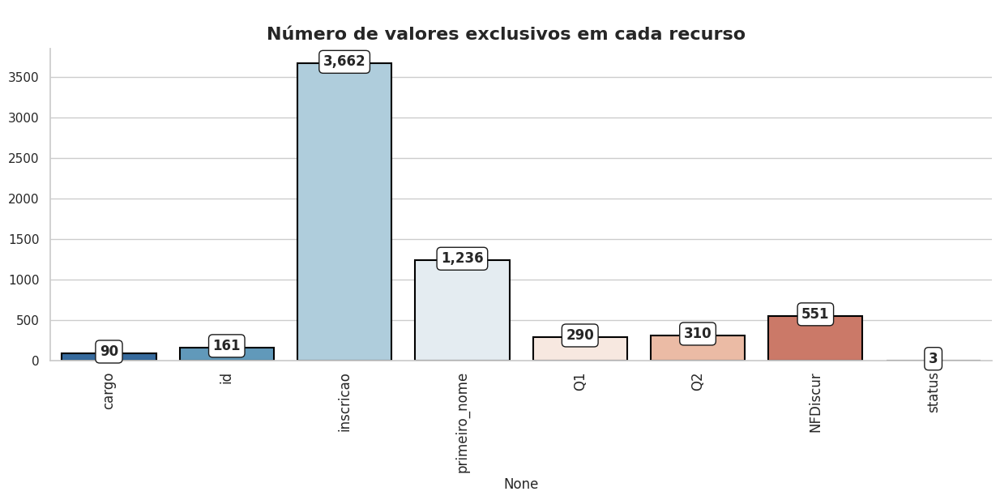

In [133]:
value_features(df)

In [134]:
check_datatypes(df)

cargo            object
id                int64
inscricao         int64
primeiro_nome    object
Q1               object
Q2               object
NFDiscur         object
status           object
dtype: object

In [135]:
duplicates(df)

,cargo,id,inscricao,primeiro_nome,Q1,Q2,NFDiscur,status


In [136]:
value_null(df)

,% de valores nulos
cargo,0.0
id,0.0
inscricao,0.0
primeiro_nome,0.0
Q1,0.0
Q2,0.0
NFDiscur,0.0
status,0.0


In [137]:
df.describe()

,id,inscricao
count,3662.000000,3.662000e+03
mean,32.735937,3.002417e+06
std,29.429055,1.392668e+03
min,1.000000,3.000005e+06
25%,11.000000,3.001184e+06
50%,24.000000,3.002502e+06
75%,45.000000,3.003616e+06
max,161.000000,3.004822e+06


In [138]:
# Corrigir os valores na coluna "D1", "D2" e "NFObj"
df['Q1'] = df['Q1'].replace('- -', np.nan).astype('float64')  # Remover traços
df['Q2'] = df['Q2'].replace('- -', np.nan).astype('float64')  # Remover traços
df['NFDiscur'] = df['NFDiscur'].replace('- -', np.nan).astype('float64')  # Remover traços

In [139]:
check_datatypes(df)

cargo             object
id                 int64
inscricao          int64
primeiro_nome     object
Q1               float64
Q2               float64
NFDiscur         float64
status            object
dtype: object

In [140]:
df['order_count'] = 1

### Dataset dos selecionados para 2ª Fase

In [201]:
shape_datatypes(df_disc)

Qtde de linhas: 1373
Qtde de colunas: 7


,Cargo,Class,Inscricao,Concorre Vagas Negros,Concorre Vagas PCD,NFDiscur,Habilitado
0,PE01,1,3003732,N,N,230.0,Sim
1,PE01,2,3000077,N,S,225.0,Sim
2,PE01,3,3002817,N,N,187.5,Sim
3,PE01,4,3002200,N,N,132.5,Sim
4,PE01,5,3002123,N,N,130.0,Sim


In [202]:
resumetable(df_disc)

,Name,dtypes,Missing,Uniques,First Value,Entropy
0,Cargo,object,0,90,PE01,6.05
1,Class,int64,0,64,1,5.13
2,Inscricao,int64,0,1373,3003732,10.42
3,Concorre Vagas Negros,object,0,2,N,0.60
4,Concorre Vagas PCD,object,0,2,N,0.12
5,NFDiscur,float64,0,330,230.0,7.50
6,Habilitado,object,0,2,Sim,1.00


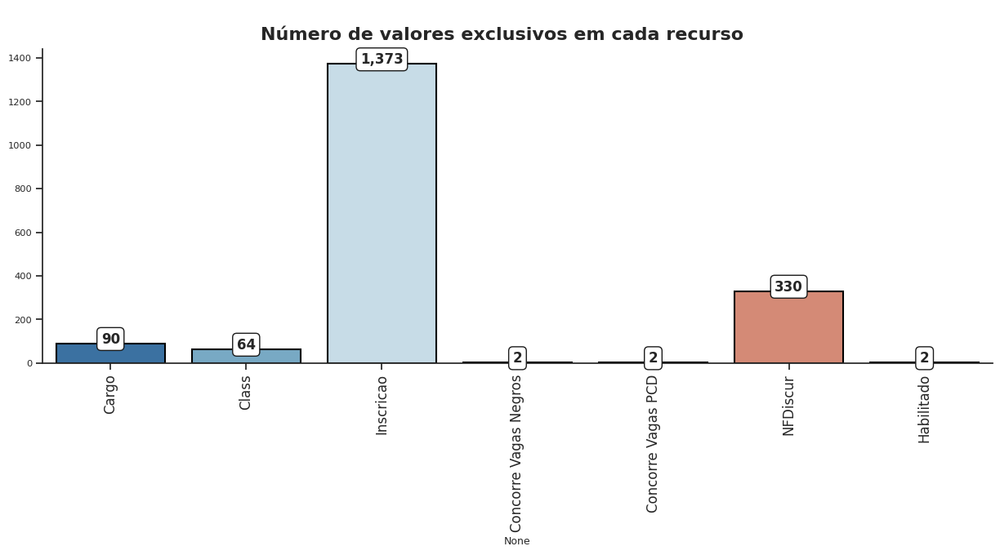

In [203]:
value_features(df_disc)

In [204]:
# Renomeando as colunas conforme as especificações
df_disc.rename(columns={'Cargo': 'cargo',
                   'Class': 'classificacao',
                   'Inscrição': 'inscricao',
                   'Concorre Vagas Negros': 'vagas_negros',
                   'Concorre Vagas PCD': 'vagas_pcd',
                   'Selecionado para correção da prova discursiva': 'selecionado'},
          inplace=True)

# Agora você pode usar o DataFrame com os nomes de colunas alterados

In [205]:
check_datatypes(df_disc)

cargo             object
classificacao      int64
Inscricao          int64
vagas_negros      object
vagas_pcd         object
NFDiscur         float64
Habilitado        object
dtype: object

In [206]:
duplicates(df_disc)

,cargo,classificacao,Inscricao,vagas_negros,vagas_pcd,NFDiscur,Habilitado


In [207]:
value_null(df_disc)

,% de valores nulos
cargo,0.0
classificacao,0.0
Inscricao,0.0
vagas_negros,0.0
vagas_pcd,0.0
NFDiscur,0.0
Habilitado,0.0


In [208]:
df_disc.describe()

,classificacao,Inscricao,NFDiscur
count,1373.000000,1.373000e+03,1373.000000
mean,13.557174,3.002305e+06,64.300618
std,11.991274,1.329839e+03,54.346028
min,1.000000,3.000011e+06,5.000000
25%,5.000000,3.001212e+06,14.200000
50%,10.000000,3.002323e+06,57.000000
75%,19.000000,3.003386e+06,100.000000
max,64.000000,3.004822e+06,240.625000


## Distribuição dos cargos/perfis

A estrutura organizacional da Fundação Oswaldo Cruz é composto por 16 órgãos específicos singulares, também conhecidos como Unidades Técnico-Científicas, distribuídos em várias regiões do Brasil (figura abaixo).

![Organograma2023.png](https://portal.fiocruz.br/sites/portal.fiocruz.br/files/arquivos/Organograma2023.png)

**Fonte**: https://portal.fiocruz.br/organograma

**Data de referência**: 13/04/2024

Cada uma das Unidades e escritórios desempenham funções específicas em diversas áreas, tais como escolas; indústrias farmacêuticas; institutos de pesquisa; hospitais; centros de referência; laboratórios e centros de produção de insumos para a saúde, além de estarem envolvidos em atividades relacionadas à divulgação científica, pesquisa, ensino e documentação da história da saúde pública e das ciências biomédicas no Brasil.

In [149]:
# Criar um dicionário mapeando as siglas dos cargos aos estados correspondentes
cargo_estado_map = dict(zip(df_cargos['Sigla'], df_cargos['Estado']))

# Aplicar o mapeamento para criar a coluna 'estado' em df_new
df['estado'] = df['cargo'].map(cargo_estado_map)

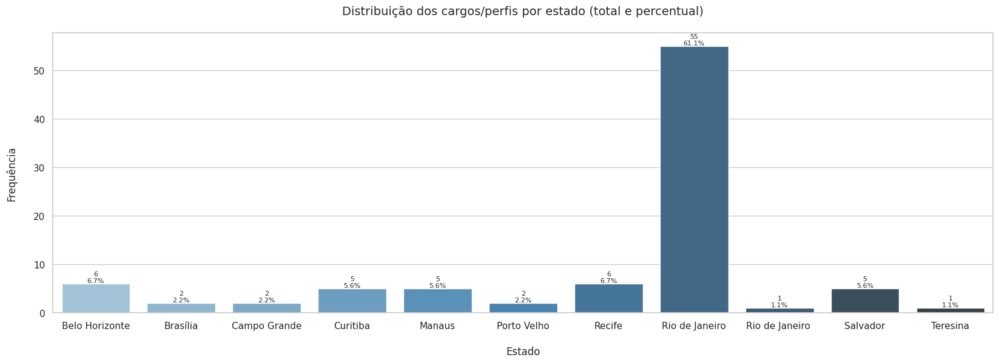

In [243]:
fig, ax = plt.subplots(figsize=(20, 6))
single_countplot(df_cargos, x= "Estado", ax=ax, palette = 'Blues_d' )
ax.set_title ('Distribuição dos cargos/perfis por estado (total e percentual)\n', size=14)
plt.xlabel('\nEstado', size=12)
plt.ylabel('Frequência\n', size=12)
plt.show()

## Distribuição das vagas

As informações abaixo foram obtidas por meio do ANEXO I do Edital (
DISTRIBUIÇÃO DAS VAGAS/PERFIS; APRESENTAÇÕES DE ÁREA, PERFIS, VAGAS, UNIDADES, ATRIBUIÇÕES, PRÉ-REQUISITOS E CONTEÚDO PROGRAMÁTICO)

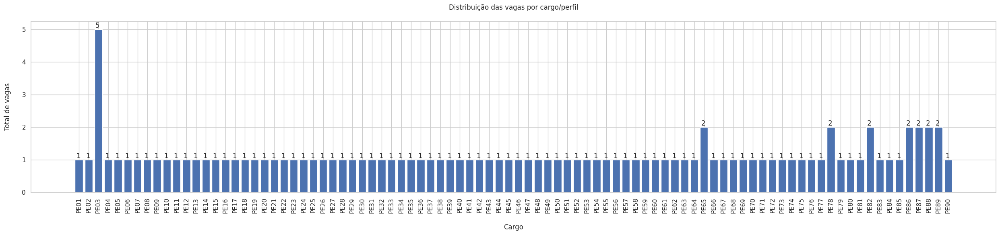

In [151]:
# Selecionando os dados de interesse
dados_para_grafico = df_cargos.groupby('Sigla').sum().iloc[:, 3:23]

# Criando o gráfico
plt.figure(figsize=(25, 6))
bars = plt.bar(dados_para_grafico.index, dados_para_grafico.sum(axis=1))
plt.xlabel('\nCargo')
plt.ylabel('Total de vagas\n')
plt.title('Distribuição das vagas por cargo/perfil\n')
plt.xticks(rotation=90)

# Adicionando rótulos de quantidade em cima de cada barra
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2 - 0.3, yval, round(yval, 2), va='bottom')

plt.tight_layout()
plt.show()

### Por Unidade e/ou Órgão Seccional

In [109]:
soma_total = df_cargos.iloc[:, 4:23].sum().sum()
print("O total de vagas é:", soma_total)

O total de vagas é: 100


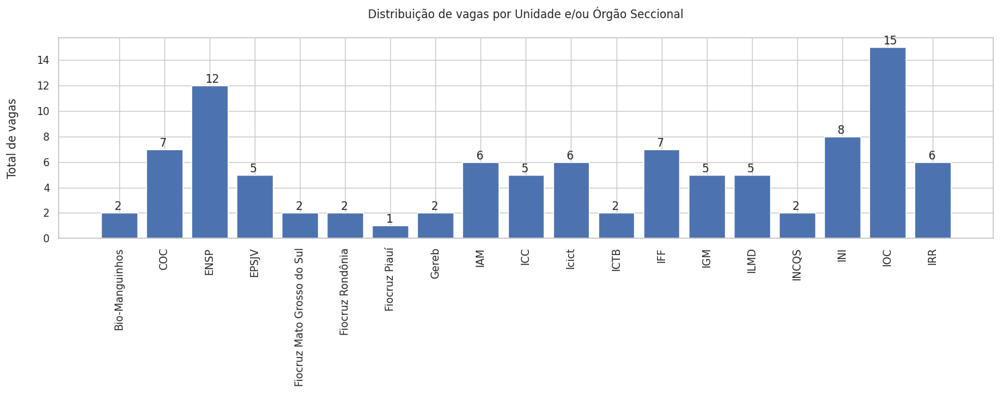

In [152]:
# Obtendo as colunas de 4 a 23
colunas_para_somar = df_cargos.iloc[:, 4:23]

# Somando as instâncias individualmente
soma_por_coluna = colunas_para_somar.sum(axis=0)

# Criando o gráfico
plt.figure(figsize=(15, 6))
bars = plt.bar(soma_por_coluna.index, soma_por_coluna.values)
plt.xlabel('')
plt.ylabel('Total de vagas\n')
plt.title('Distribuição de vagas por Unidade e/ou Órgão Seccional\n')
plt.xticks(rotation=90)  # Rotaciona os rótulos do eixo x para melhor visualização

# Adicionando rótulos de quantidade em cima de cada barra
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2 - 0.1, yval, round(yval, 2), va='bottom')

plt.tight_layout()  # Ajusta o layout para evitar cortes
plt.show()

 ### De ampla concorrência por cargo

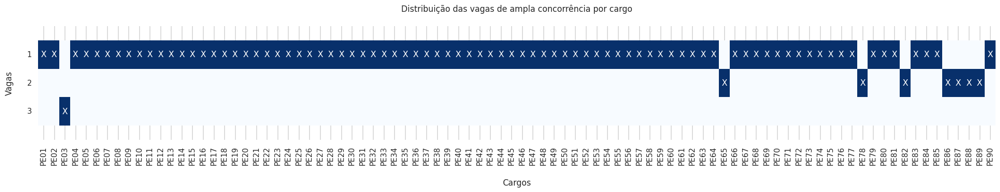

In [153]:
# Calcular o total de ocorrências para cada cargo
total_por_cargo = df_cargos['order_count'].groupby(df_cargos['Sigla']).sum()

# Calcular a distribuição por status e cargo em relação ao total por cargo
distribution = df_cargos.groupby(['Ampla concorrência', 'Sigla'])['order_count'].sum().unstack() / total_por_cargo

# Substituir valores "1" por "X"
distribution.replace(1, 'X', inplace=True)

# Substituir valores NaN por uma string vazia
distribution.fillna('', inplace=True)

# Plotar o heatmap
plt.figure(figsize=(25, 3))
ax = sns.heatmap(distribution.isin(['X']).astype(int), cmap='Blues', annot=distribution, fmt='', cbar=False) # fmt='' para não mostrar os valores numéricos
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

# Configurar rótulos e título
ax.set(xlabel='\nCargos',
       ylabel='Vagas\n',
       title='Distribuição das vagas de ampla concorrência por cargo\n')

# Rotacionar rótulos do eixo y
for item in ax.get_yticklabels():
    item.set_rotation(0)

plt.show()

**Nota:** O total apresentado, **85** (oitenta e cinco) vagas, difere do **Capítulo 3, Item 3.1** - *...para o provimento de **100** (cem) vagas, sendo **75** (setenta e cinco) vagas de ampla concorrência, **20** (vinte) vagas reservadas para pessoas negras e **5** (cinco) vagas reservadas para pessoas com deficiência para a classe inicial do Cargo de Analista de Gestão em Saúde, na carreira de Gestão em Ciência, Tecnologia, Produção e Inovação em Saúde Pública.*

### Pessoas autodeclaradas negras por cargo

Conforme o Edital (**Capítulo 9**), considera-se pessoa negra a pessoa que se autodeclarou preta ou parda, conforme o quesito cor ou raça usado pela **Fundação Instituto Brasileiro de Geografia e Estatística (IBGE)**, e que possuir traços fenotípicos que a caracterizem como de cor **preta** ou **parda**.

O candidato que se autodeclarou preto ou pardo poderia, nos termos do Edital, concorre a 20 (vinte) vagas, correspondentes a 20% (vinte por cento) do total das vagas, atendendo ao disposto no artigo 1º, § 2º, da Lei nº 12.990 de 9 de junho de 2014 e da Instrução Normativa MGI nº 23 de 25 de julho de 2023.

A reserva das vagas somente será feita para os candidatos que se autodeclararem pretos ou pardos, no ato da inscrição. Onde a autodeclaração goza da presunção relativa de veracidade e terá validade somente para este Concurso Público.

____

**Nota 1**: A autodeclaração do candidato seria confirmada mediante procedimento de heteroidentificação.
____

Os candidatos que auto se declararem negros concorrem, concomitantemente:

- a) às vagas destinadas a ampla concorrência de acordo com sua classificação no Concurso;
- b) às vagas reservadas às pessoas negras;
- c) às vagas reservadas às pessoas com deficiência, se atenderem a essa condição.

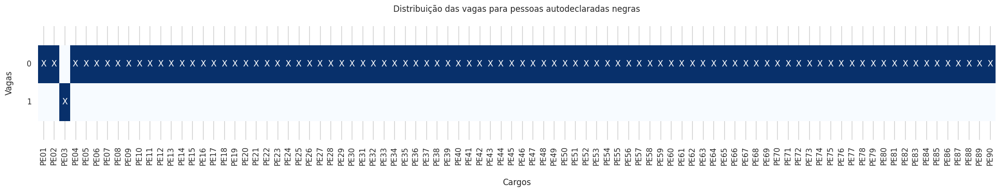

In [154]:
# Calcular o total de ocorrências para cada cargo
total_por_cargo = df_cargos['order_count'].groupby(df_cargos['Sigla']).sum()

# Calcular a distribuição por status e cargo em relação ao total por cargo
distribution = df_cargos.groupby(['Candidatos negros', 'Sigla'])['order_count'].sum().unstack() / total_por_cargo

# Substituir valores "1" por "X"
distribution.replace(1, 'X', inplace=True)

# Substituir valores NaN por uma string vazia
distribution.fillna('', inplace=True)

# Plotar o heatmap
plt.figure(figsize=(25, 3))
ax = sns.heatmap(distribution.isin(['X']).astype(int), cmap='Blues', annot=distribution, fmt='', cbar=False) # fmt='' para não mostrar os valores numéricos
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

# Configurar rótulos e título
ax.set(xlabel='\nCargos',
       ylabel='Vagas\n',
       title='Distribuição das vagas para pessoas autodeclaradas negras\n')

# Rotacionar rótulos do eixo y
for item in ax.get_yticklabels():
    item.set_rotation(0)

plt.show()

**Nota:** O total apresentado, 15 (quinze) vagas, difere do informado no **Capítulo 3, Item 3.1** - *...**20** (vinte) vagas reservadas para pessoas negras...*

### Pessoas com Deficiência (PcD)

O Edital não explicíta o local das vagas que estejam relacionadas a **PcD**. Desta forma entende-se que as vagas atenderão ao **Capítulo 7** do Edital, de acordo com as vagas definidas pelas Unidades e/ou Órgãos Seccionais. Conforme informado no **Capítulo 3, Item 3.1** - *... 5 (cinco) vagas reservadas para pessoas com deficiência...*

## Distribuição dos inscritos

### Por cargo e perfil

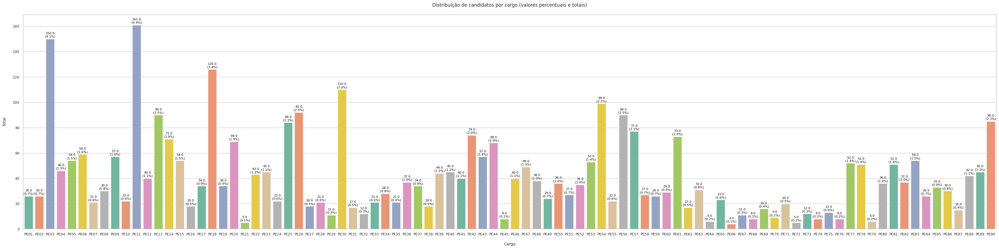

In [155]:
fig = plt.subplots(figsize=(45, 10))
count_plot(feature='cargo', df=df, title='Distribuição de candidatos por cargo (valores percentuais e totais)\n',
           xlabel='\nCargo',
           ylabel='Total\n')

### Distribuição de candidatos inscritos (cargo X Estado)

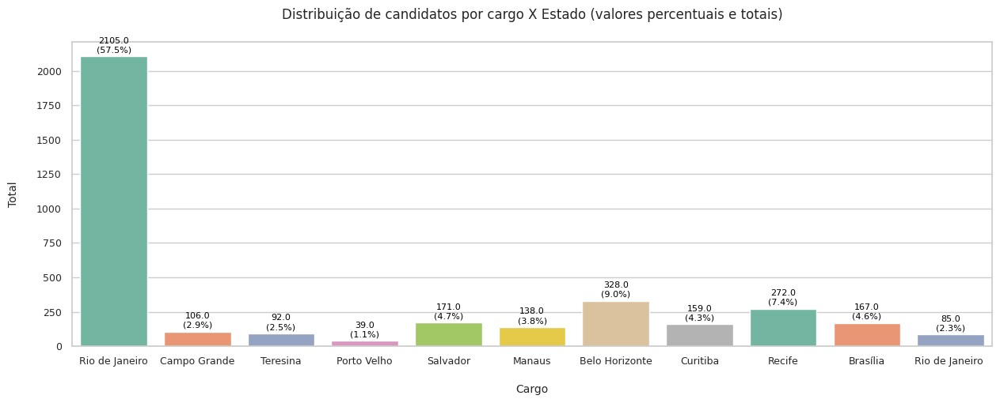

In [157]:
fig = plt.subplots(figsize=(15, 5))
count_plot(feature='estado', df=df, title='Distribuição de candidatos por cargo X Estado (valores percentuais e totais)\n',
           xlabel='\nCargo',
           ylabel='Total\n')

## 1ª Fase - Prova de Conhecimentos Específicos

A seguir apresentamos a distribuição no comparecimento as provas de conhecimentos específicos.

### Distribuição do comparecimento

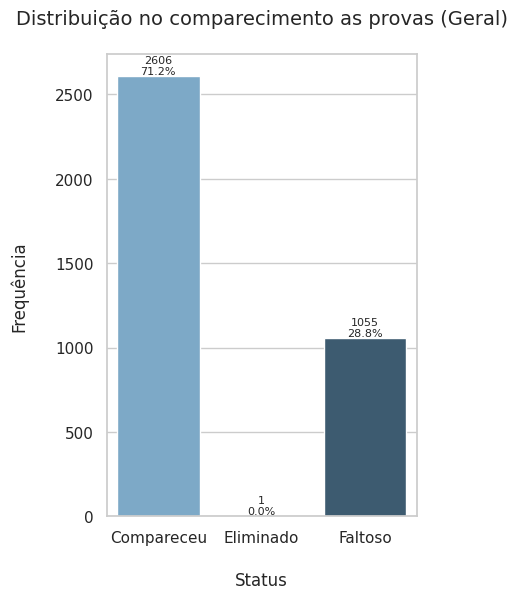

In [158]:
fig, ax = plt.subplots(figsize=(4, 6))
single_countplot(df, x= 'status', ax=ax, palette = 'Blues_d' )
ax.set_title ('Distribuição no comparecimento as provas (Geral)\n', size=14)
plt.xlabel('\nStatus', size=12)
plt.ylabel('Frequência\n', size=12)
plt.show()

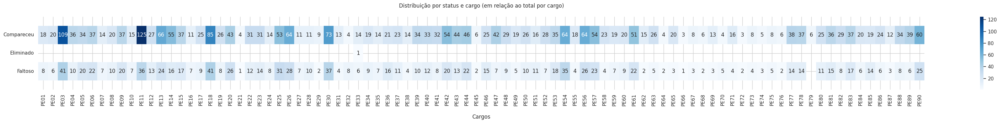

In [159]:
# Distribuição por status e cargo (total em relação ao total do cargo)
order_count = df.groupby(['status','cargo'])\
                                 .count()['order_count'].unstack()
plt.figure(figsize=(45, 3))
ax = sns.heatmap(order_count, cmap='Blues', annot=True, fmt='g')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

ax.set(xlabel='\nCargos',
       ylabel='',
       title='Distribuição por status e cargo (em relação ao total por cargo)\n')
for item in ax.get_yticklabels():
    item.set_rotation(0)
plt.show()

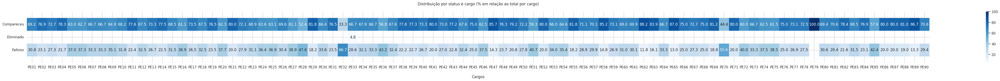

In [160]:
# Distribuição percentual por status e cargo (% em relação ao total por cargo)
order_percent = df.groupby(['status', 'cargo']).size().unstack()
order_percent = order_percent.div(order_percent.sum(), axis=1) * 100

plt.figure(figsize=(65, 3))
ax = sns.heatmap(order_percent, cmap='Blues', annot=True, fmt='.1f')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

ax.set(xlabel='\nCargos',
       ylabel='',
       title='Distribuição por status e cargo (% em relação ao total por cargo)\n')
for item in ax.get_yticklabels():
    item.set_rotation(0)
plt.show()

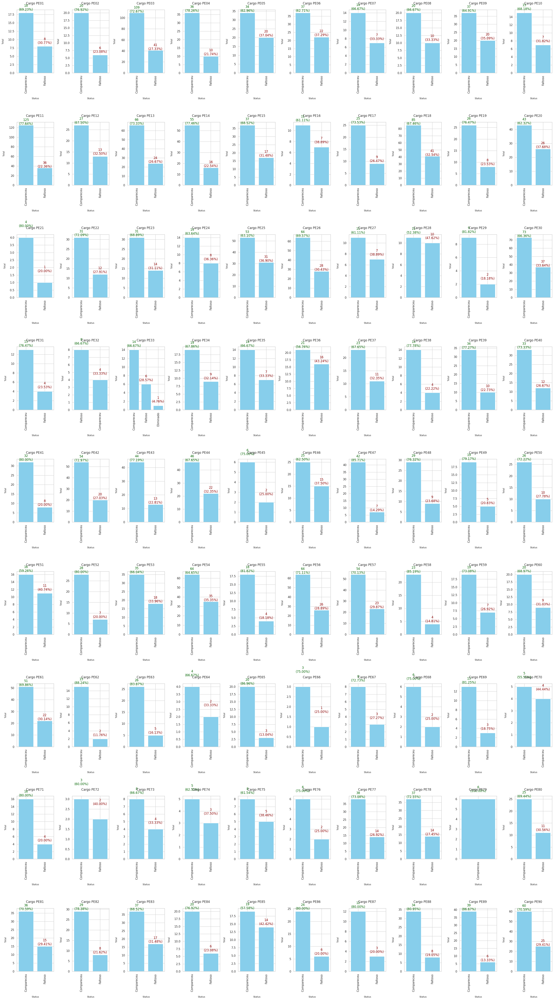

In [161]:
# Distribuição percentual por status e cargo individualmente
plot_cargo_status(df, column='cargo')

### Densidade e distribuição das notas das provas de Conhecimentos Específicos (visão geral)

- Q1 = Questão 01 da Prova Discursiva
- Q2 = Questão 02 da Prova Discursiva
- NFDiscur = Q1 + Q2

#### Distribuição de Notas (NFDiscur) por Cargo

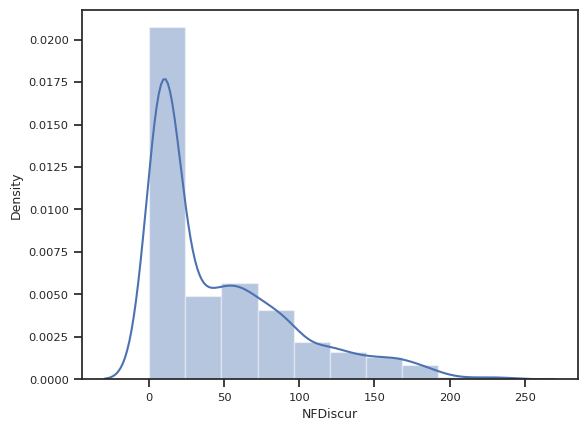

In [163]:
# Densidade para a nota final consolidada das provas de Conhecimentos Específicos
sns.set(style="ticks", color_codes=True, font_scale=0.75)
sns.distplot(df["NFDiscur"],bins=10)
plt.show()

<Axes: xlabel='cargo', ylabel='NFDiscur'>

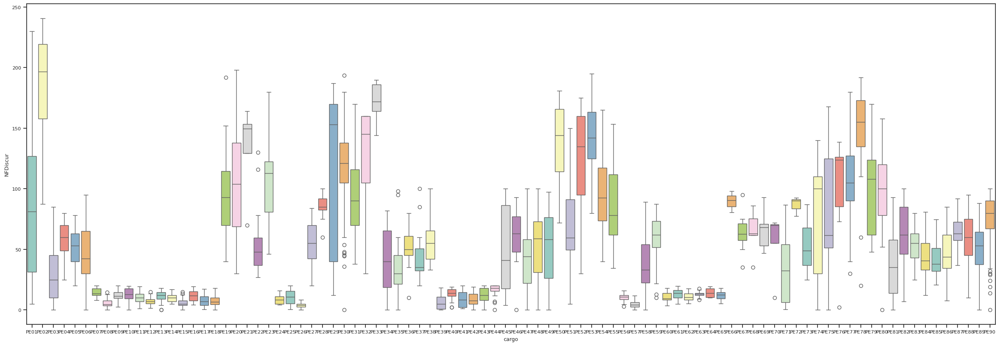

In [164]:
fig = plt.figure(figsize=(30,10))
sns.boxplot(x="cargo", y="NFDiscur", data=df, palette="Set3")

### Distribuição das notas das provas de Conhecimentos Específicos (somente aprovados)

In [166]:
# Corrigir os valores na coluna "D1", "D2" e "NFDiscur"
colunas = ['Q1', 'Q2', 'NFDiscur']

# Substituindo '-' por NaN e convertendo para float
df['Q1'] = df['Q1'].replace('-', np.nan).astype(float)
df['Q2'] = df['Q2'].replace('-', np.nan).astype(float)

# Preenchendo NaN com 0 e convertendo para int
df['Q1'] = df['Q1'].fillna(0).astype(int)
df['Q2'] = df['Q2'].fillna(0).astype(int)

In [180]:
# Inicializando coluna 'status'
df['situacao_status'] = ""

# Função para avaliar cada critério e atribuir o status correspondente
def avaliar_status(row):
    cargo = row['cargo']
    Q1 = row['Q1']
    Q2 = row['Q2']

    if cargo in ['PE07', 'PE08', 'PE09', 'PE10', 'PE11', 'PE12', 'PE13', 'PE14', 'PE15', 'PE16',
                 'PE17', 'PE18', 'PE24', 'PE25', 'PE26','PE39', 'PE40', 'PE41', 'PE42', 'PE43',
                 'PE44', 'PE56', 'PE57']:
        if (Q1 + Q2) >= 5:
            return 'aprovado'
        else:
            return 'reprovado'

    elif cargo in ['PE60', 'PE61', 'PE62', 'PE63', 'PE64', 'PE65']:
        if (Q1 + Q2) >= 10:
            return 'aprovado'
        else:
            return 'reprovado'

    elif cargo in ['PE74', 'PE75', 'PE76', 'PE77', 'PE78']:
        if (Q1 + Q2) >= 100:
            return 'aprovado'
        else:
            return 'reprovado'
    else:
        if (Q1 + Q2) >= 50:
            return 'aprovado'
        else:
            return 'reprovado'

# Aplicando a função e atribuindo o status
df['situacao_status'] = df.apply(avaliar_status, axis=1)

____
**Nota**: Para o cargo de Pesquisador em Saúde Pública não houve a aplicação de Prova Objetiva.
____

In [181]:
# Filtrando apenas os aprovados
df_aprovados = df[df["situacao_status"] == "aprovado"]

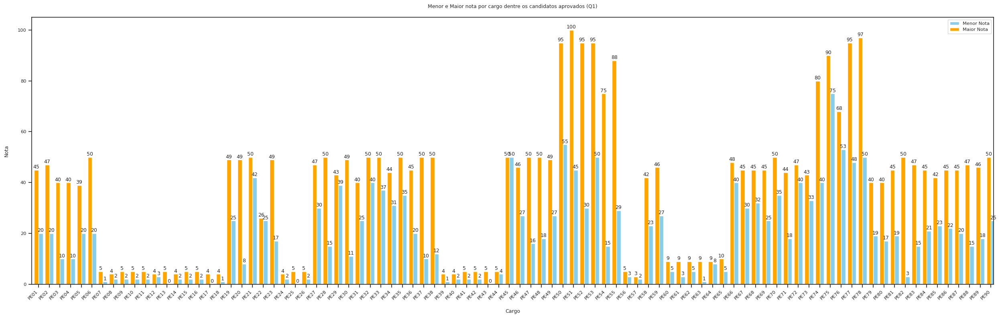

In [183]:
plotar_notas_aprovados(df_aprovados, 'Q1')

<Axes: xlabel='cargo', ylabel='Q1'>

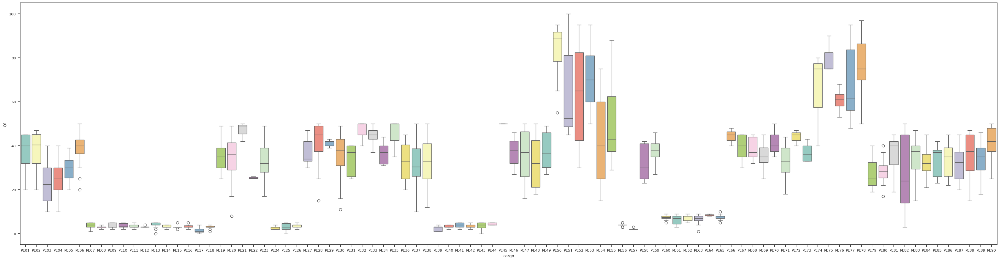

In [186]:
fig = plt.figure(figsize=(40,10))
sns.boxplot(x="cargo", y="Q1", data=df_aprovados, palette="Set3")

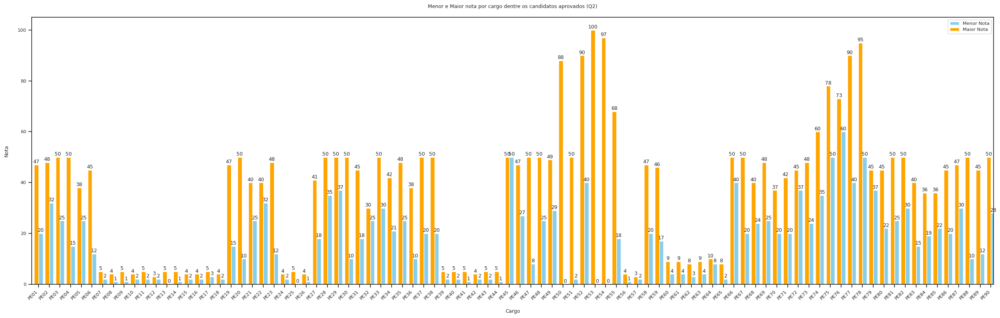

In [187]:
plotar_notas_aprovados(df, 'Q2')

____
**Nota**: Apesar de candidatos terem a nota mínima com valor 0 (zero) em Q2 eles conseguirem o valor da nota necessária na Q1 para a sua aprovação.
___

<Axes: xlabel='cargo', ylabel='Q2'>

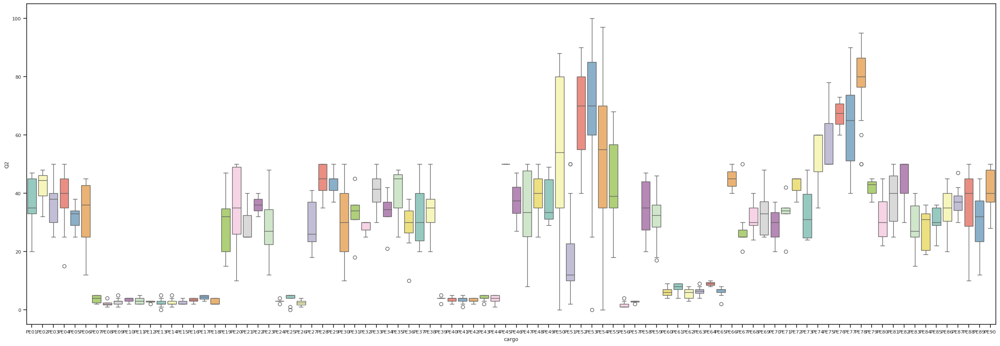

In [188]:
fig = plt.figure(figsize=(30,10))
sns.boxplot(x="cargo", y="Q2", data=df_aprovados, palette="Set3")

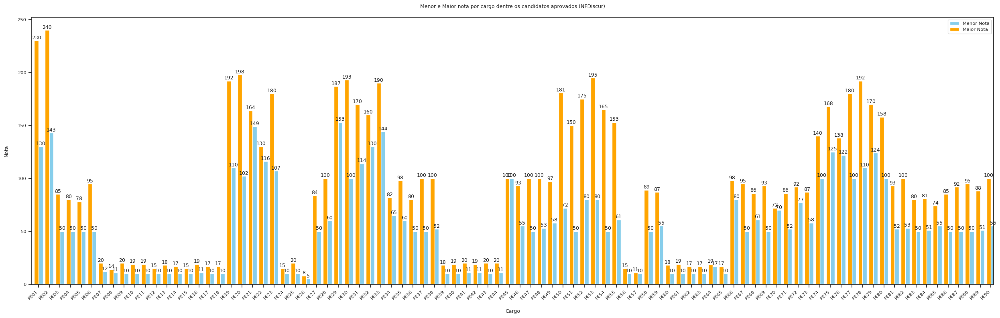

In [189]:
plotar_notas_aprovados(df, 'NFDiscur')

<Axes: xlabel='cargo', ylabel='NFDiscur'>

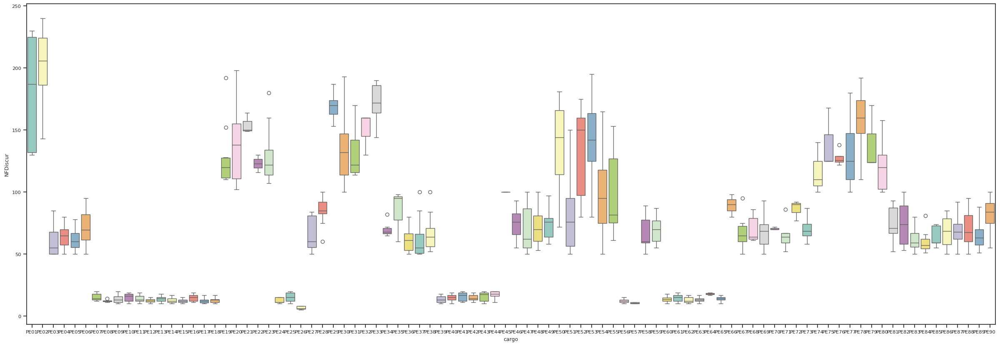

In [190]:
fig = plt.figure(figsize=(30,10))
sns.boxplot(x="cargo", y="NFDiscur", data=df_aprovados, palette="Set3")

### Distribuição por aprovação

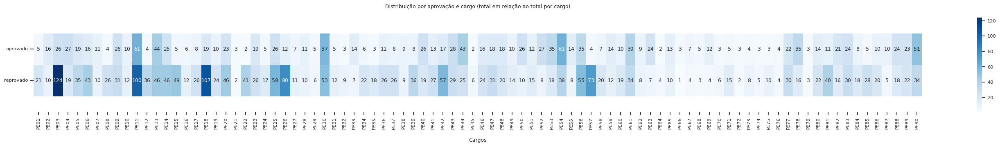

In [191]:
# Distribuição por aprovação e cargo (total em relação ao total por cargo)
order_count = df.groupby(['situacao_status','cargo'])\
                                 .count()['order_count'].unstack()
plt.figure(figsize=(35, 3))
ax = sns.heatmap(order_count, cmap='Blues', annot=True, fmt='g')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

ax.set(xlabel='\nCargos',
       ylabel='',
       title='Distribuição por aprovação e cargo (total em relação ao total por cargo)\n')
for item in ax.get_yticklabels():
    item.set_rotation(0)
plt.show()

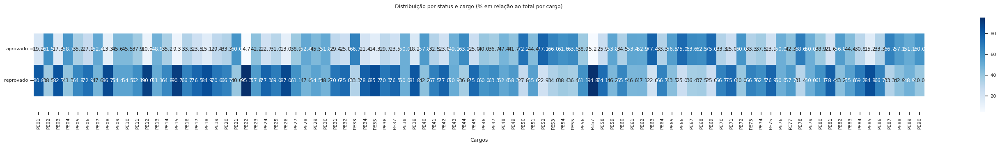

In [192]:
# Calculando a distribuição percentual por aprovação e cargo em relação aos totais de cada cargo
order_percent = df.groupby(['situacao_status', 'cargo']).size().unstack()
order_percent = order_percent.div(order_percent.sum(), axis=1) * 100

plt.figure(figsize=(35, 3))
ax = sns.heatmap(order_percent, cmap='Blues', annot=True, fmt='.1f')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

ax.set(xlabel='\nCargos',
       ylabel='',
       title='Distribuição por status e cargo (% em relação ao total por cargo)\n')
for item in ax.get_yticklabels():
    item.set_rotation(0)
plt.show()

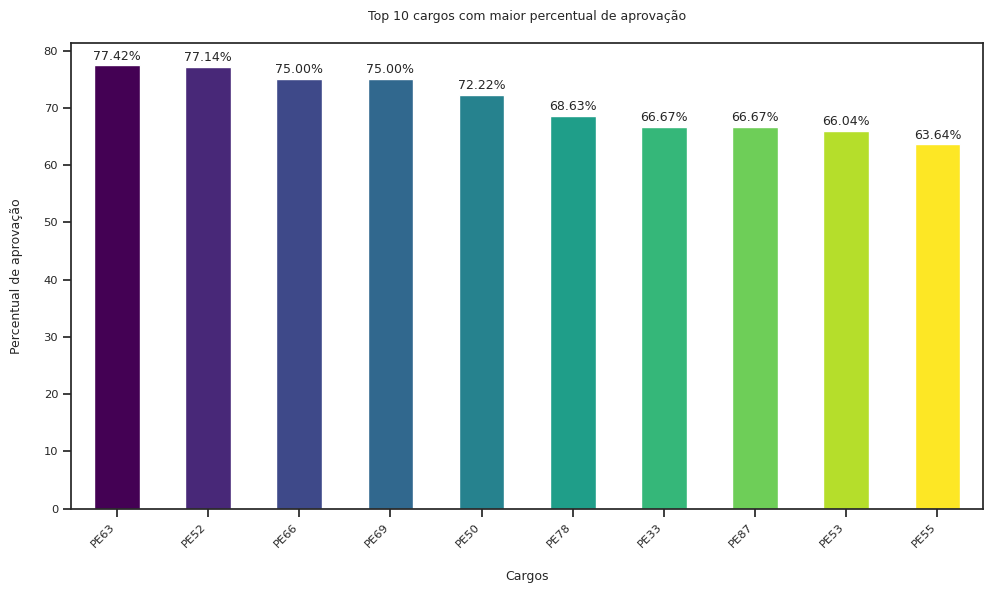

In [193]:
# Top 10 cargos com maior percentual de aprovação
plot_top_n_cargos(df, 10, 'Top 10 cargos com maior percentual de aprovação', ascending=False)

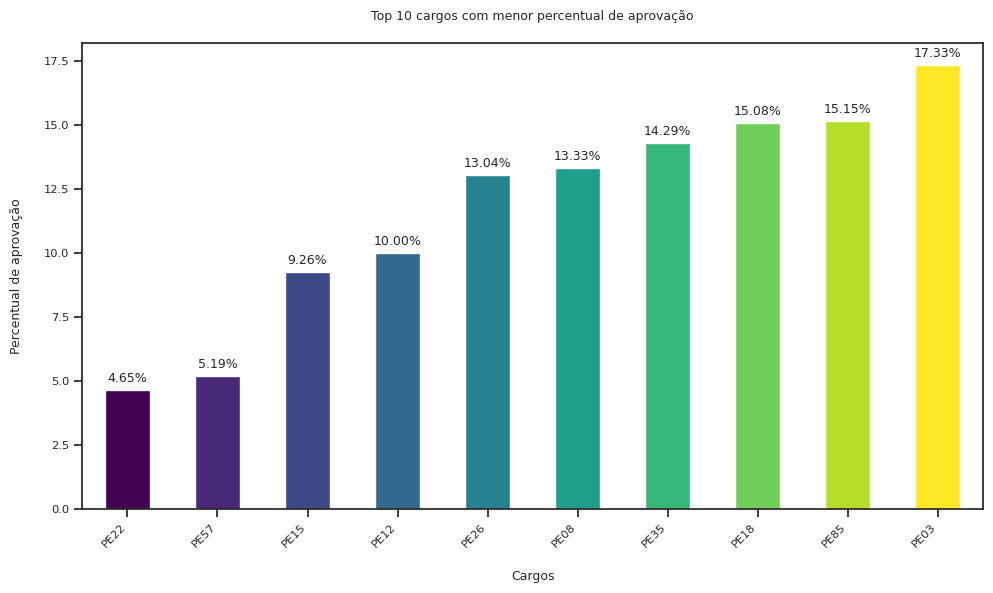

In [194]:
# Top 10 cargos com menor percentual de aprovação
# Calculando a distribuição percentual por cargo em relação aos totais de cada cargo
order_percent = df.groupby('cargo')['situacao_status'].apply(lambda x: (x == 'aprovado').mean() * 100)
bottom_10_cargos = order_percent.nsmallest(10)

# Criando o gráfico de barras com cores diferentes para cada barra
plt.figure(figsize=(10, 6))
colors = plt.cm.viridis(np.linspace(0, 1, len(bottom_10_cargos)))  # Utilizando a paleta de cores 'viridis'
bottom_10_cargos.plot(kind='bar', color=colors)

# Adicionando os valores acima das colunas
for i, v in enumerate(bottom_10_cargos):
    plt.text(i, v + 0.2, f'{v:.2f}%', ha='center', va='bottom')

plt.title('Top 10 cargos com menor percentual de aprovação\n')
plt.xlabel('\nCargos')
plt.ylabel('Percentual de aprovação\n')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Distribuição dos nomes (primeiro nome)

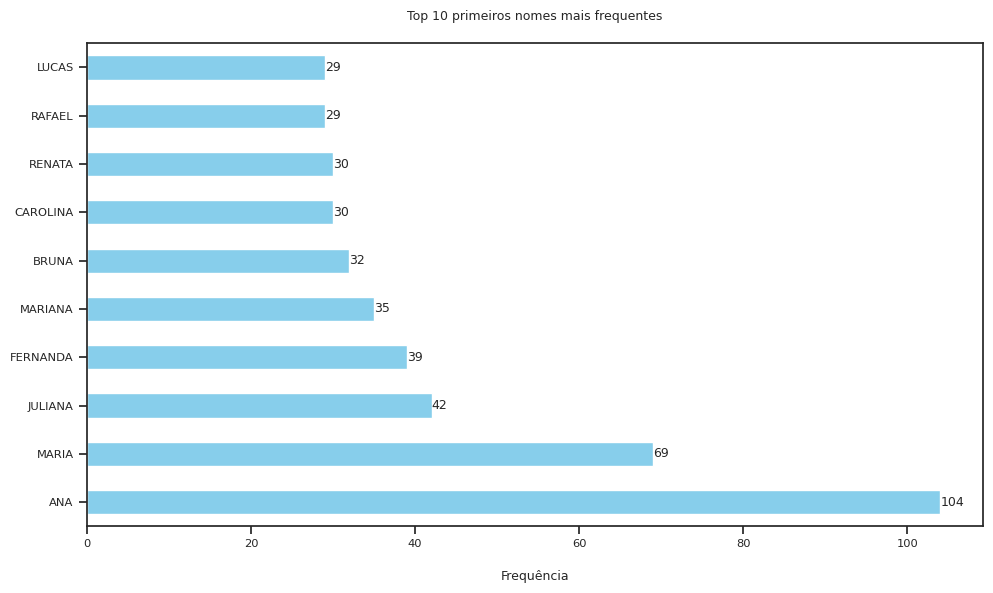

In [195]:
# Contando a frequência de cada primeiro nome
top_10_nomes = df['primeiro_nome'].value_counts().nlargest(10)

# Criando o gráfico de barras horizontais
plt.figure(figsize=(10, 6))
top_10_nomes.plot(kind='barh', color='skyblue')

# Adicionando os valores ao lado das barras
for i, v in enumerate(top_10_nomes):
    plt.text(v, i, str(v), ha='left', va='center')

plt.title('Top 10 primeiros nomes mais frequentes\n')
plt.xlabel('\nFrequência')
plt.ylabel('')
plt.tight_layout()
plt.show()

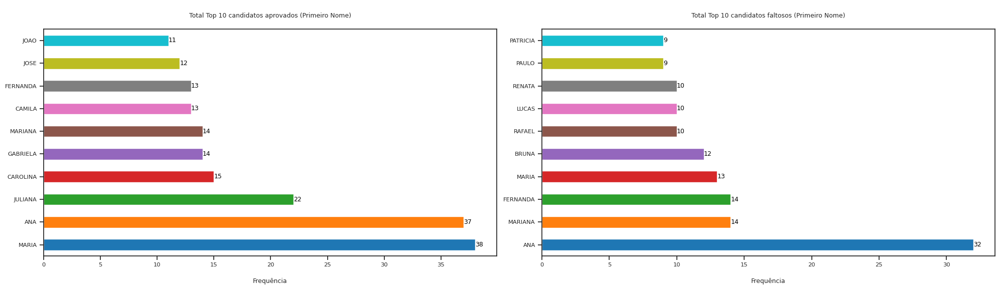

In [196]:
import matplotlib.colors as mcolors

# Filtrando o DataFrame para incluir apenas os candidatos aprovados
aprovados = df[df['situacao_status'] == 'aprovado']

# Verificando se há dados disponíveis para os candidatos aprovados
if aprovados.empty:
    print("Não há dados disponíveis para os candidatos aprovados.")
else:
    # Contando a frequência de cada primeiro nome entre os candidatos aprovados
    top_10_nomes_aprovados = aprovados['primeiro_nome'].value_counts().nlargest(10)

    # Criando cores intercaladas usando uma paleta de cores do Matplotlib
    colors = [mcolors.to_hex(color) for color in mcolors.TABLEAU_COLORS.values()]

    # Criando a primeira figura para o gráfico de barras dos candidatos aprovados
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)  # Definindo o subplot 1
    top_10_nomes_aprovados.plot(kind='barh', color=colors[:len(top_10_nomes_aprovados)])
    for i, v in enumerate(top_10_nomes_aprovados):
        plt.text(v, i, str(v), ha='left', va='center', color='black')
    plt.title('\nTotal Top 10 candidatos aprovados (Primeiro Nome)\n')
    plt.xlabel('\nFrequência\n')
    plt.ylabel('\n')

# Filtrando o DataFrame para incluir apenas os candidatos faltosos
faltosos = df[df['status'] == 'Faltoso']

# Verificando se há dados disponíveis para os candidatos faltosos
if faltosos.empty:
    print("Não há dados disponíveis para os candidatos faltosos.")
else:
    # Contando a frequência de cada primeiro nome entre os candidatos faltosos
    top_10_nomes_faltosos = faltosos['primeiro_nome'].value_counts().nlargest(10)

    # Criando cores intercaladas usando uma paleta de cores do Matplotlib
    colors = [mcolors.to_hex(color) for color in mcolors.TABLEAU_COLORS.values()]

    # Criando a segunda figura para o gráfico de barras dos candidatos faltosos
    plt.subplot(1, 2, 2)  # Definindo o subplot 2
    top_10_nomes_faltosos.plot(kind='barh', color=colors[:len(top_10_nomes_faltosos)])
    for i, v in enumerate(top_10_nomes_faltosos):
        plt.text(v, i, str(v), ha='left', va='center', color='black')
    plt.title('\nTotal Top 10 candidatos faltosos (Primeiro Nome)\n')
    plt.xlabel('\nFrequência\n')
    plt.ylabel('\n\n')

# Ajustando o layout e exibindo os gráficos
plt.tight_layout()
plt.show()

## 2ª Fase - Entrega de Títulos

**Importante**: Não foi aplicada a cláusula de barreira para a seleção de pessoas de candidatos inscritos nas cotas de pessoas negras e cotas para pessoas com deficiência (Capítulo 12, subitem 12.2.7.1.).

In [209]:
contagem_cargos_disc = df_disc['cargo'].value_counts()

# Apresentando a quantidade de cada cargo
# print("Quantidade de cada cargo:")
# print(contagem_cargos)

# Valor total de todos os cargos
total_cargos = contagem_cargos_disc.sum()
print("Total de inscrições aptas para avaliação da prova discursiva (todos os cargos):", total_cargos)

Total de inscrições aptas para avaliação da prova discursiva (todos os cargos): 1373


### Distribuição para correção da prova discursiva

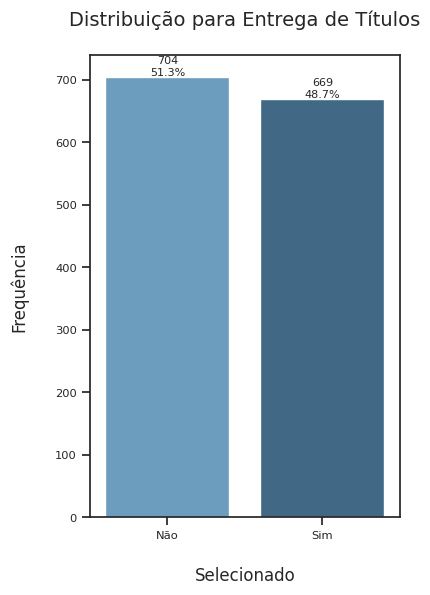

In [211]:
fig, ax = plt.subplots(figsize=(4, 6))
single_countplot(df_disc, x= "Habilitado", ax=ax, palette = 'Blues_d' )
ax.set_title ('Distribuição para Entrega de Títulos\n', size=14)
plt.xlabel('\nSelecionado', size=12)
plt.ylabel('Frequência\n', size=12)
plt.show()

### Análise dos candidatos não selecionados

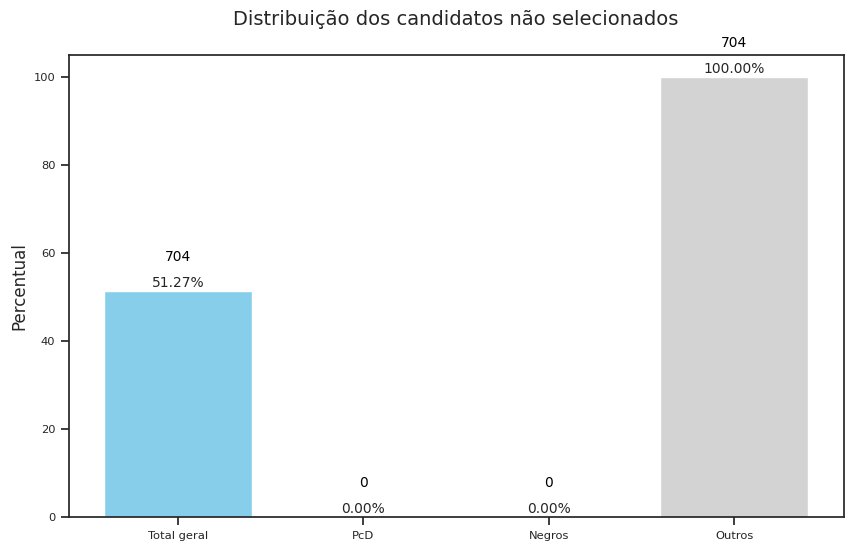

In [212]:
nao_selecionados = df_disc[df_disc["Habilitado"] == "Não"]

# Função para verificar se o candidato não é PCD e não é autodeclarado negro
def nao_pcd_e_nao_negro(row):
    return row["vagas_pcd"] != "S" and row["vagas_negros"] != "S"

# Criar uma nova coluna aplicando a função
nao_selecionados["nao_PcD_negros"] = nao_selecionados.apply(nao_pcd_e_nao_negro, axis=1)

# Calcular o total de cada categoria
total_nao_selecionados = len(nao_selecionados)
total_pcd = len(nao_selecionados[nao_selecionados["vagas_pcd"] == "S"])
total_negros = len(nao_selecionados[nao_selecionados["vagas_negros"] == "S"])
total_nao_pcd_nao_negros = len(nao_selecionados[nao_selecionados["nao_PcD_negros"] == True])

# Calcular percentuais
percentual_selecionados = total_nao_selecionados / len(df_disc) * 100
percentual_pcd = total_pcd / len(df_disc) * 100
percentual_negros = total_negros / len(df_disc) * 100
percentual_nao_pcd_nao_negros = total_nao_pcd_nao_negros / total_nao_selecionados * 100

# Criar um gráfico com colunas separadas para cada categoria
fig, ax = plt.subplots(figsize=(10, 6))

# Definir os rótulos e as alturas das barras
categorias = ['Total geral', 'PcD', 'Negros', 'Outros']
valores = [percentual_selecionados, percentual_pcd, percentual_negros, percentual_nao_pcd_nao_negros]
totais = [total_nao_selecionados, total_pcd, total_negros, total_nao_pcd_nao_negros]

# Plotar as barras
ax.bar(categorias, valores, color=['skyblue', 'lightgreen', 'salmon', 'lightgray'])

# Adicionar os valores acima de cada barra
for i, valor in enumerate(valores):
    ax.text(i, valor + 1, f'{valor:.2f}%', ha='center', size=10)
    ax.text(i, valor + 7, f'{totais[i]}', ha='center', size=10, color='black')

# Configurar o título e os rótulos dos eixos
ax.set_title('Distribuição dos candidatos não selecionados\n', size=14)
ax.set_ylabel('Percentual', size=12)

plt.show()

### Distribuição dos candidatos não selecionados por cargo

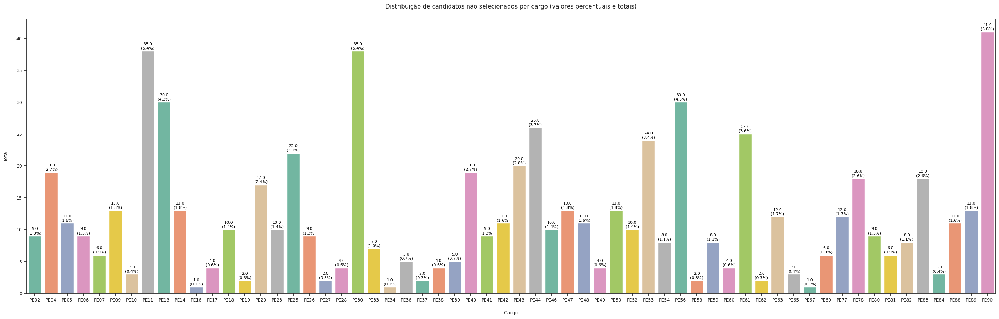

In [213]:
# Filtrar os dados para os casos em que os candidatos são selecionados para correção da prova discursiva
nao_selecionados = df_disc[df_disc["Habilitado"] == "Não"]
fig = plt.subplots(figsize=(35, 10))
count_plot(feature='cargo', df=nao_selecionados, title='Distribuição de candidatos não selecionados por cargo (valores percentuais e totais)\n',
           xlabel='\nCargo',
           ylabel='Total\n')

Não teremos como foco análises adicionais para os candidatos não selecionados.

### Análise dos candidatos selecionados

In [214]:
# Criar um dicionário mapeando as siglas dos cargos aos estados correspondentes
cargo_estado_map = dict(zip(df_cargos['Sigla'], df_cargos['Estado']))

# Aplicar o mapeamento para criar a coluna 'estado' em df_new
df_disc['estado'] = df_disc['cargo'].map(cargo_estado_map)

In [216]:
# Filtrar os dados para os casos em que os candidatos são selecionados para correção da prova discursiva
selecionados = df_disc[df_disc["Habilitado"] == "Sim"]

#### Distribuição por Estado

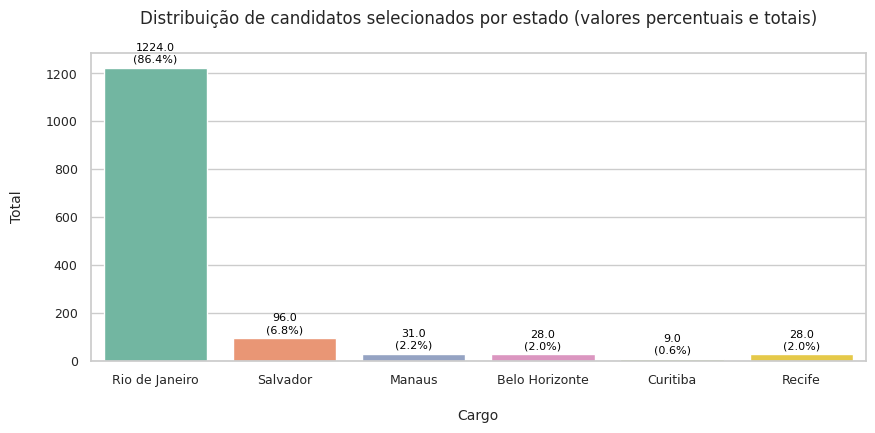

In [ ]:
fig = plt.subplots(figsize=(10, 4))
count_plot(feature='estado', df=selecionados, title='Distribuição de candidatos selecionados por estado (valores percentuais e totais)\n',
           xlabel='\nCargo',
           ylabel='Total\n')

#### Distribuição por Cargo

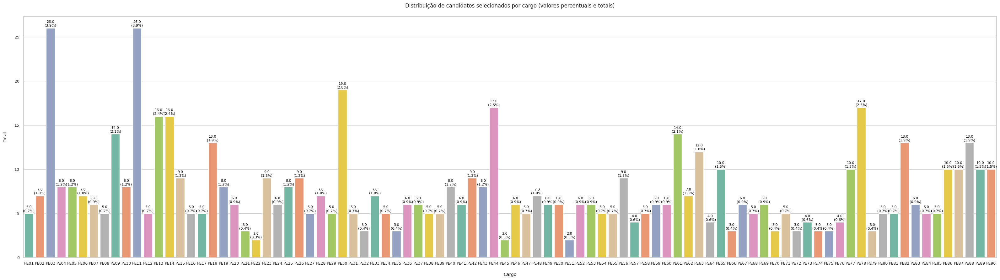

In [217]:
fig = plt.subplots(figsize=(40, 10))
count_plot(feature='cargo', df=selecionados, title='Distribuição de candidatos selecionados por cargo (valores percentuais e totais)\n',
           xlabel='\nCargo',
           ylabel='Total\n')

#### Distribuição das notas máximas e mínimas dos selecionados por cargo e por grupo

In [218]:
!pip install tabulate --quiet

In [220]:
from tabulate import tabulate

In [223]:
# Inicialize uma lista vazia para armazenar os resultados para cada cargo
resultados_por_cargo = []

# Loop sobre cada cargo único presente no DataFrame
for cargo in selecionados['cargo'].unique():
    # Filtrar os dados para o cargo atual
    dados_cargo = selecionados[selecionados['cargo'] == cargo]

    # Verificar se há dados para o cargo atual
    if not dados_cargo.empty:
        # Filtrar os dados para aqueles que não são autodeclarados negros ou PCD
        sem_negros_pcd = dados_cargo[(dados_cargo['vagas_negros'] != 'S') & (dados_cargo['vagas_pcd'] != 'S')]
        min_max_sem_negros_pcd = (sem_negros_pcd['NFDiscur'].min(), sem_negros_pcd['NFDiscur'].max())

        if not sem_negros_pcd.empty:
            resultados_por_cargo.append({
                'Cargo': cargo,
                'Grupo': 'Outros',
                'Nota Mínima': min_max_sem_negros_pcd[0],
                'Nota Máxima': min_max_sem_negros_pcd[1]
            })

        # Filtrar os dados para aqueles que são autodeclarados negros
        negros = dados_cargo[dados_cargo['vagas_negros'] == 'S']
        min_max_negros = (negros['NFDiscur'].min(), negros['NFDiscur'].max())

        if not negros.empty:
            resultados_por_cargo.append({
                'Cargo': cargo,
                'Grupo': 'Negros',
                'Nota Mínima': min_max_negros[0],
                'Nota Máxima': min_max_negros[1]
            })

        # Filtrar os dados para aqueles que são PCD
        pcd = dados_cargo[dados_cargo['vagas_pcd'] == 'S']
        min_max_pcd = (pcd['NFDiscur'].min(), pcd['NFDiscur'].max())

        if not pcd.empty:
            resultados_por_cargo.append({
                'Cargo': cargo,
                'Grupo': 'PcD',
                'Nota Mínima': min_max_pcd[0],
                'Nota Máxima': min_max_pcd[1]
            })

# Converter a lista de resultados em um DataFrame
resultados = pd.DataFrame(resultados_por_cargo)

# Preencher os valores NaN com 0
resultados = resultados.fillna(0)

# Exibir os resultados em formato de tabela
print(tabulate(resultados, headers='keys', tablefmt='grid'))

+-----+---------+---------+---------------+---------------+
|     | Cargo   | Grupo   |   Nota Mínima |   Nota Máxima |
+=====+=========+=========+===============+===============+
|   0 | PE01    | Outros  |       130     |       230     |
+-----+---------+---------+---------------+---------------+
|   1 | PE01    | PcD     |       225     |       225     |
+-----+---------+---------+---------------+---------------+
|   2 | PE02    | Outros  |       221.875 |       240.625 |
+-----+---------+---------+---------------+---------------+
|   3 | PE02    | Negros  |       187.5   |       234.375 |
+-----+---------+---------+---------------+---------------+
|   4 | PE03    | Outros  |        50     |        85     |
+-----+---------+---------+---------------+---------------+
|   5 | PE03    | PcD     |        78     |        78     |
+-----+---------+---------+---------------+---------------+
|   6 | PE04    | Outros  |        75     |        80     |
+-----+---------+---------+-------------

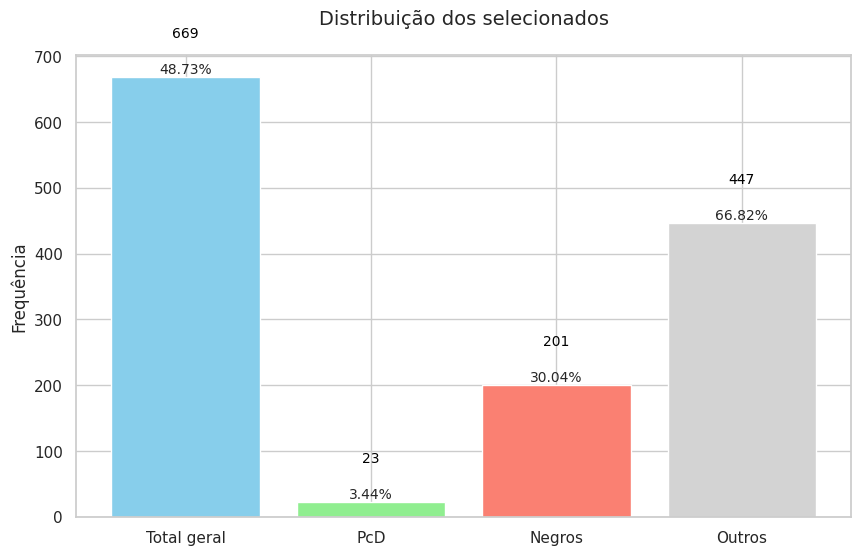

In [224]:
# Função para verificar se o candidato não é PcD e não é negro
def nao_pcd_e_nao_negro(row):
    return row["vagas_pcd"] != "S" and row["vagas_negros"] != "S"

# Criar uma nova coluna aplicando a função
selecionados["nao_PcD_negros"] = selecionados.apply(nao_pcd_e_nao_negro, axis=1)

# Calcular o total de selecionados, total de PcD entre os selecionados e total
# de autodeclarados Negros entre os selecionados
total_selecionados = len(selecionados)
total_pcd = len(selecionados[selecionados["vagas_pcd"] == "S"])
total_negros = len(selecionados[selecionados["vagas_negros"] == "S"])
total_nao_pcd_nao_negros = len(selecionados[selecionados["nao_PcD_negros"] == True])

# Calcular percentuais
percentual_selecionados = total_selecionados / len(df_disc) * 100
percentual_pcd = total_pcd / total_selecionados * 100
percentual_negros = total_negros / total_selecionados * 100
percentual_nao_pcd_nao_negros = total_nao_pcd_nao_negros / total_selecionados * 100

# Criar um gráfico com colunas separadas para cada categoria
fig, ax = plt.subplots(figsize=(10, 6))

# Definir os rótulos e as alturas das barras
categorias = ['Total geral', 'PcD', 'Negros', 'Outros']
valores = [total_selecionados, total_pcd, total_negros, total_nao_pcd_nao_negros]
percentuais = [percentual_selecionados, percentual_pcd, percentual_negros, percentual_nao_pcd_nao_negros]

# Plotar as barras
ax.bar(categorias, valores, color=['skyblue', 'lightgreen', 'salmon', 'lightgray'])

# Adicionar os valores acima de cada barra
for i, valor in enumerate(valores):
    ax.text(i, valor + 5, f'{percentuais[i]:.2f}%', ha='center', size=10)
    ax.text(i, valor + 60, f'{valor}', ha='center', size=10, color='black')

# Configurar o título e os rótulos dos eixos
ax.set_title('Distribuição dos selecionados\n', size=14)
ax.set_ylabel('Frequência', size=12)

plt.show()

#### Autodeclarados como pessoas negras

**Alguns aspectos importantes presentes no Edital que objetivam atender a Legislação e a inclusão social**

- A reserva das vagas somente será feita para os candidatos que se autodeclararam pretos ou pardos, no ato da inscrição.
- Os candidatos negros aprovados dentro do número de vagas oferecidas à ampla concorrência não preencherão as vagas reservadas aos candidatos negros, na forma do § 1º do art. 9º da Instrução Normativa MGI nº 23/2023.
- Os candidatos negros que obtiverem pontuação suficiente para aprovação em ampla concorrência deverão figurar tanto na lista de classificados dentro das vagas reservadas, quanto na lista de classificados da ampla concorrência.
- Em caso de não preenchimento da vaga reservada a candidatos negros no Concurso Público, a vaga não preenchida será ocupada pelo candidato negro aprovado na posição imediatamente subsequente na lista de reserva de vagas, de acordo com a ordem de classificação.
- Na hipótese de não haver candidatos negros aprovados em número suficiente para que sejam ocupadas as vagas reservadas durante o prazo de validade do Concurso Público, as vagas remanescentes serão revertidas para ampla concorrência e serão preenchidas pelos demais candidatos aprovados, observada a ordem de classificação geral por Cargo/Perfil.
- A nomeação dos candidatos aprovados respeitará os critérios de alternância e de proporcionalidade, que consideram a relação entre o número total de vagas e o número de vagas reservadas aos candidatos com deficiência e aos candidatos negros.

##### Distribuição dos candidatos por cargo

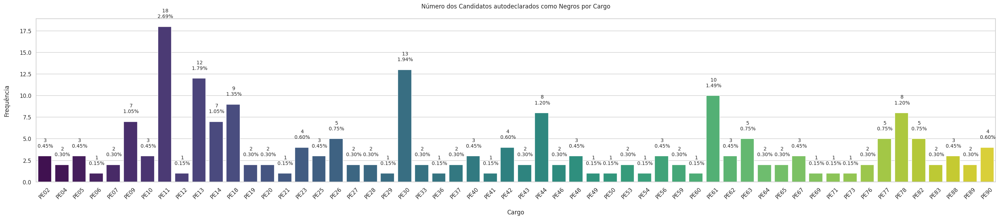

In [225]:
# Função para verificar se o candidato não é autodeclarado negro
def nao_negro(row):
    return row["vagas_negros"] != "S"

# Criar uma nova coluna aplicando a função
selecionados["nao_negro"] = selecionados.apply(nao_negro, axis=1)

# Obter os cargos onde há inscritos autodeclarados negros
cargos_com_negros = selecionados[selecionados["nao_negro"] == False]["cargo"].value_counts()

# Ordenar os cargos alfabeticamente
cargos_com_negros = cargos_com_negros.sort_index()

# Plotar o gráfico de barras
plt.figure(figsize=(35, 6))
ax = sns.barplot(x=cargos_com_negros.index, y=cargos_com_negros.values, palette="viridis")
plt.xlabel("\nCargo")
plt.ylabel("Frequência\n")
plt.title("Número dos Candidatos autodeclarados como Negros por Cargo\n")
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(cargos_com_negros.values):
    total = valor
    percentual = (valor / len(selecionados)) * 100
    ax.text(i, valor + 1, f' {total}\n {percentual:.2f}%', ha='center', size=10)

plt.show()

##### Distribuição dos candidatos por estado

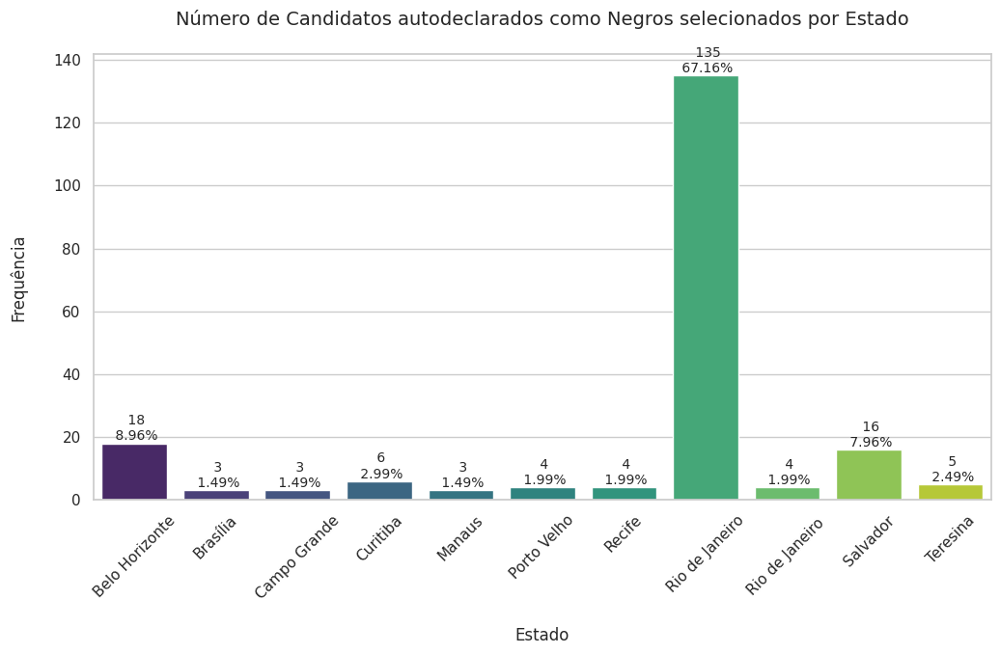

In [226]:
# Função para verificar se o candidato não é autodeclarado negro
def nao_negro(row):
    return row["vagas_negros"] != "S"

# Criar uma nova coluna aplicando a função
selecionados["nao_negro"] = selecionados.apply(nao_negro, axis=1)

# Filtrar apenas os candidatos autodeclarado negros selecionados
negros_selecionados = selecionados[selecionados["nao_negro"] == False]

# Contar o número de candidatos autodeclarados negros selecionados por estado
negros_por_estado = negros_selecionados.groupby('estado').size()

# Calcular o total de candidatos autodeclarados negros selecionados
total_negros_selecionados = len(negros_selecionados)

# Calcular percentuais de candidatos autodeclarados negros selecionados por estado
percentuais_negros_por_estado = (negros_por_estado / total_negros_selecionados) * 100

# Plotar o gráfico de barras
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=negros_por_estado.index, y=negros_por_estado.values, palette="viridis")
plt.xlabel("\nEstado", fontsize=12)
plt.ylabel("Frequência\n", fontsize=12)
plt.title("Número de Candidatos autodeclarados como Negros selecionados por Estado\n", fontsize=14)
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(negros_por_estado.values):
    percentual = percentuais_negros_por_estado[i]
    ax.text(i, valor + 1, f' {valor}\n {percentual:.2f}%', ha='center', size=10)

plt.show()

##### Distribuição das notas dos candidatos

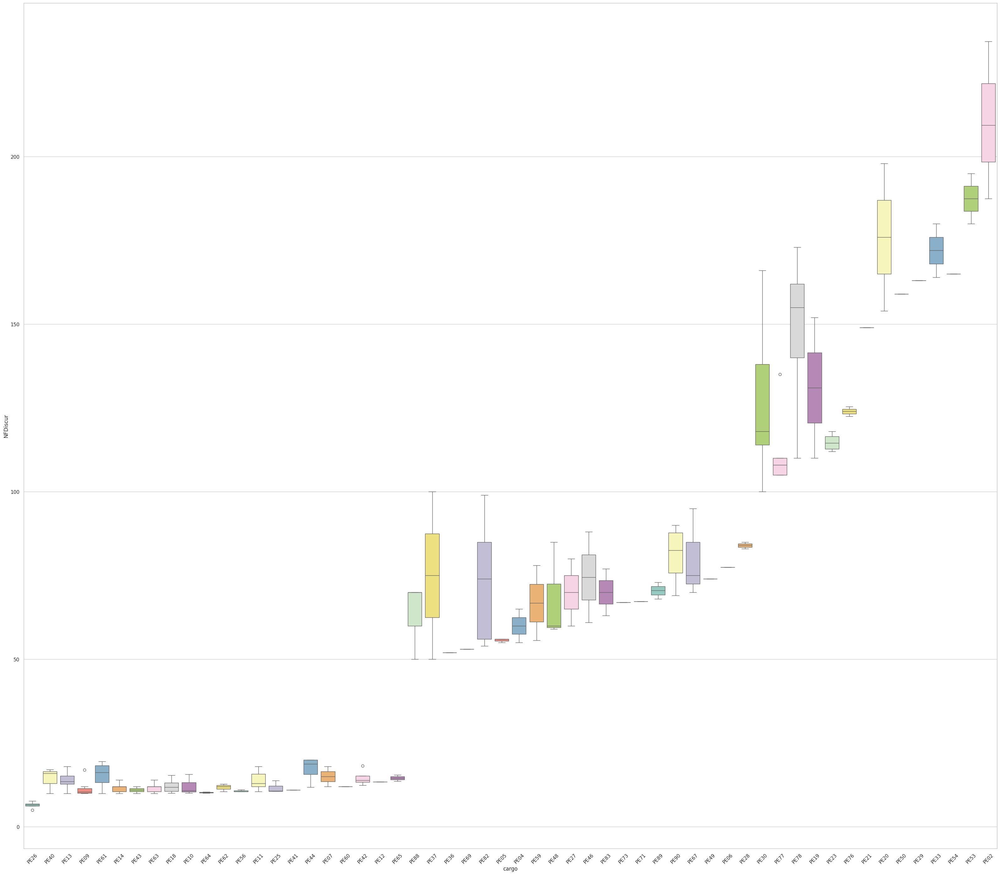

In [229]:
# Filtrar os dados para selecionados que sejam autodeclarados negros
selecionados_PCD = selecionados[(selecionados['vagas_negros'] == 'S') & (selecionados['Habilitado'] == 'Sim')]

# Ordenar os dados pelo valor de NFDiscur
selecionados_PCD = selecionados_PCD.sort_values(by='NFDiscur')

# Criar o boxplot com os dados filtrados
fig = plt.figure(figsize=(40, 35))
sns.boxplot(x="cargo", y="NFDiscur", data=selecionados_PCD, palette="Set3", order=selecionados_PCD['cargo'].unique())

# Rotacionar os rótulos do eixo x para melhor visualização
plt.xticks(rotation=45)

plt.show()

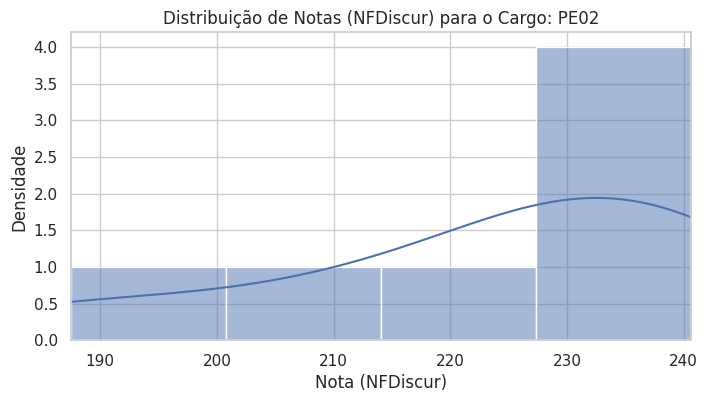

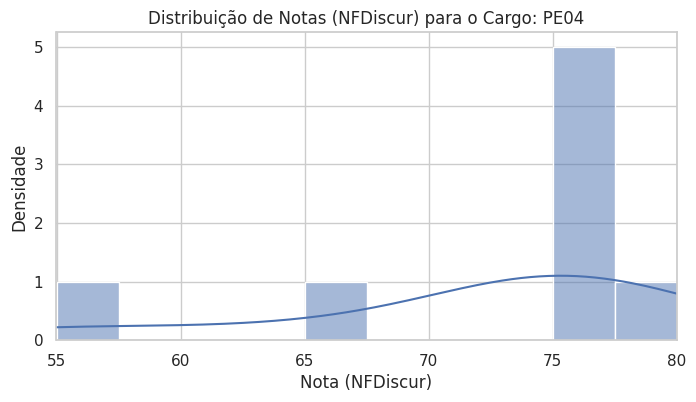

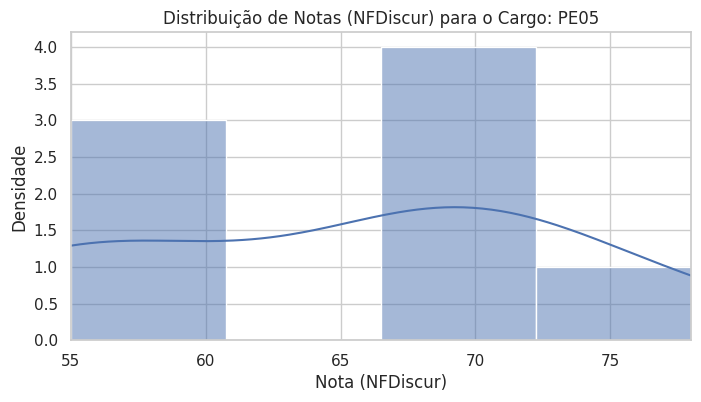

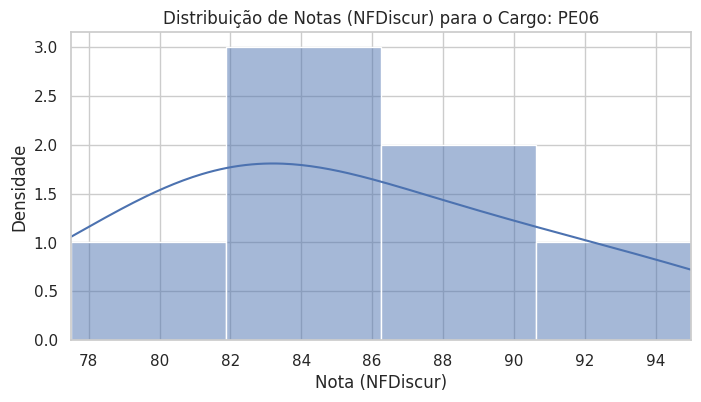

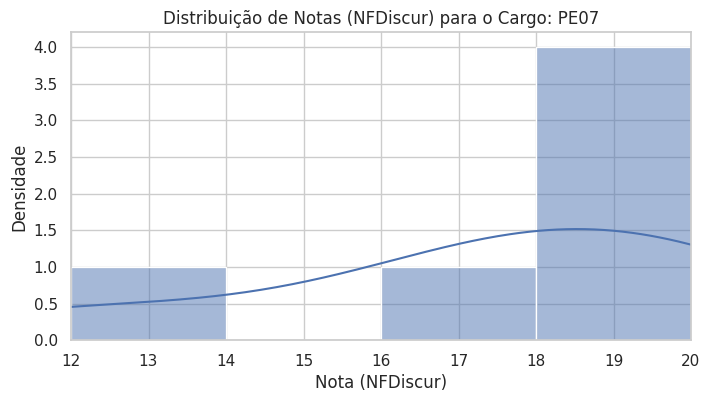

...

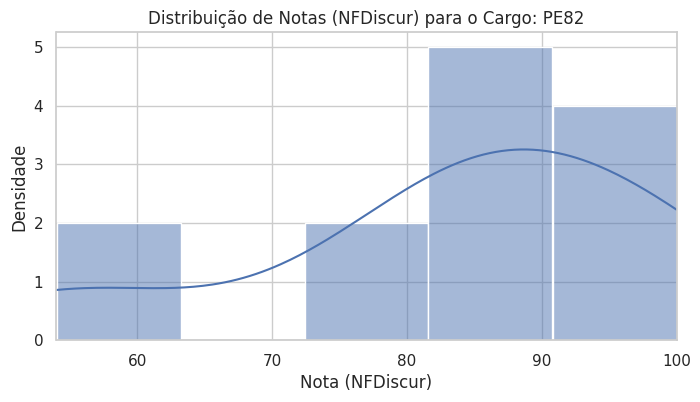

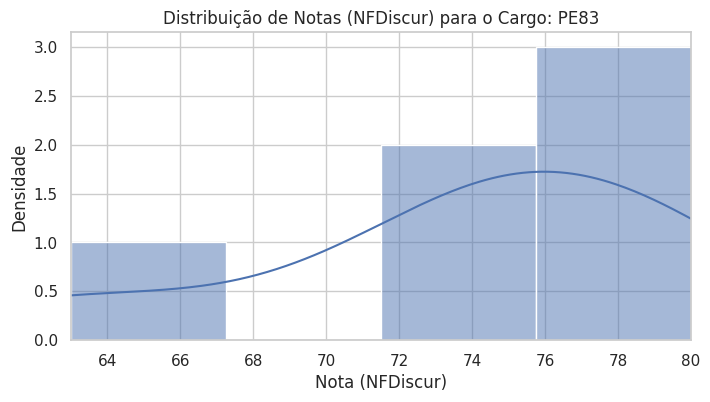

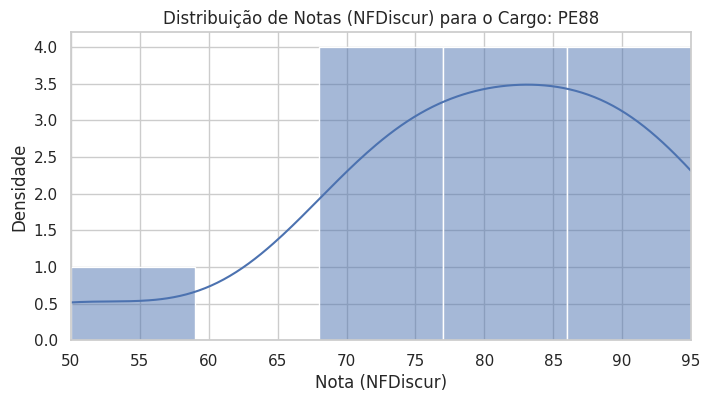

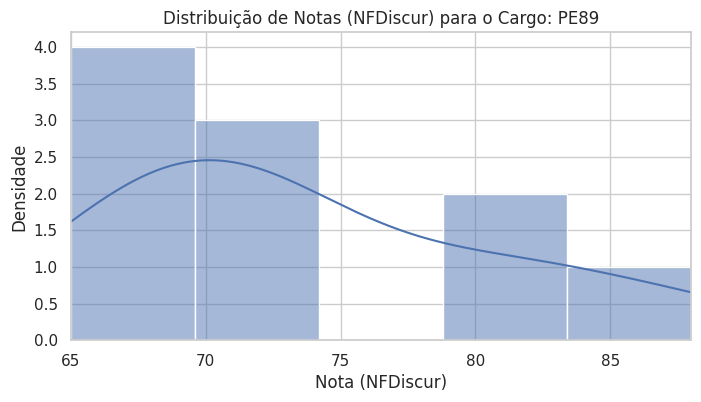

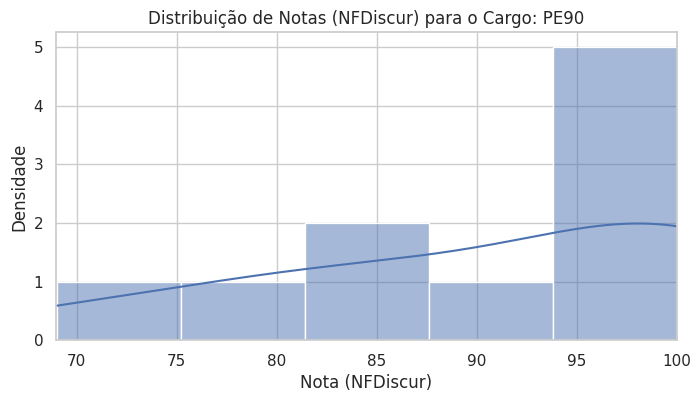

In [230]:
# Filtrar os dados para cargos onde existam vagas específicas para autodeclarados negros
cargos_unicos = selecionados[selecionados['vagas_negros'] == 'S']['cargo'].unique()

# Loop através de cada cargo
for cargo in cargos_unicos[:90]:  # Limitando a 90 cargos
    # Filtrar o DataFrame para o cargo atual
    dados_cargo = selecionados[(selecionados['cargo'] == cargo) & (selecionados['Habilitado'] == 'Sim')]

    # Encontre os limites dos eixos x para o cargo atual
    min_value = dados_cargo['NFDiscur'].min()
    max_value = dados_cargo['NFDiscur'].max()

    # Configure a figura e o subplot
    plt.figure(figsize=(8, 4))

    # Criar um gráfico de distribuição para o cargo atual
    sns.histplot(dados_cargo['NFDiscur'], kde=True)

    # Adicione título ao subplot
    plt.title(f'Distribuição de Notas (NFDiscur) para o Cargo: {cargo}')

    # Adicione rótulos aos eixos
    plt.xlabel('Nota (NFDiscur)')
    plt.ylabel('Densidade')

    # Defina os limites dos eixos x
    plt.xlim(min_value, max_value)

    # Mostre o gráfico
    plt.show()

#### Distribuição dos candidatos autodeclarados com Pessoa com Deficiência (PcD) por cargo

Conforme Edital, em cumprimento ao disposto no art. 37, inciso VIII, da Constituição Federal, de 1988, na Lei nº 7.853, de 24 de outubro
de 1989, e no art. 5º, § 2º, à Lei nº 8.112, de 11 de dezembro de 1990 e suas alterações, a pessoa com deficiência poderia, nos termos do presente Edital, concorrer a 5 (cinco) vagas, correspondentes a 5% (cinco por cento) do total das vagas, de acordo com o disposto na Lei Federal nº 13.146 de 06 de julho de 2015, e suas alterações, e do Decreto Federal nº 9.508, de 24 de setembro de 2018.

Na inexistência de candidatos com deficiência ou no caso de reprovação destes, estas vagas seriam preenchidas pelos demais aprovados da ampla concorrência, com estrita observância da ordem classificatória.

Sendo consideradas pessoas com deficiência aquelas que se enquadrarem no art. 2º da Lei nº 13.146/2015; nas categorias discriminadas no art. 4º do Decreto nº 3.298/1999, com as alterações introduzidas pelo Decreto nº 5.296/2004 e
estabelecidas na Lei nº 14.768, de 22 de dezembro de 2023; na Lei no § 1º do art. 1º da Lei nº 12.764, de 27 de dezembro de 2012 (Transtorno do Espectro Autista); e na Lei nº 14.126, de 21 de março de 2021, observados os dispositivos da Convenção sobre os Direitos da Pessoa com Deficiência e seu Protocolo Facultativo, ratificados pelo Decreto Federal nº 6.949/2009.

**Alguns aspectos importantes presentes no Edital que objetivam atender a Legislação e a inclusão social**

- O candidato com deficiência, se aprovado, seria classificado de acordo com as vagas de ampla concorrência para o Perfil ao qual concorre, bem como será classificado em relação à parte, disputando o total de vagas reservadas às pessoas com deficiência.
- O candidato que for considerado pessoa com deficiência à luz da legislação vigente, após a avaliação biopsicossocial, teria seu nome e a respectiva pontuação publicados em lista única de classificação geral por Cargo/Perfil.

##### Distribuição dos candidatos por cargo

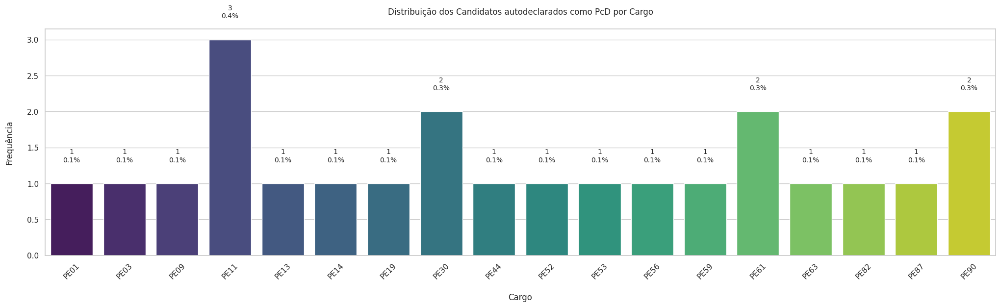

In [231]:
# Função para verificar se o candidato não é PcD
def nao_pcd(row):
    return row["vagas_pcd"] != "S"

# Criar uma nova coluna aplicando a função
selecionados["nao_pcd"] = selecionados.apply(nao_pcd, axis=1)

# Obter os cargos onde há inscritos PCD
cargos_com_pcd = selecionados[selecionados["nao_pcd"] == False]["cargo"].value_counts()

# Ordenar os cargos alfabeticamente
cargos_com_pcd = cargos_com_pcd.sort_index()

# Plotar o gráfico de barras
plt.figure(figsize=(25, 6))
ax = sns.barplot(x=cargos_com_pcd.index, y=cargos_com_pcd.values, palette="viridis")
plt.xlabel("\nCargo")
plt.ylabel("Frequência\n")
plt.title("Distribuição dos Candidatos autodeclarados como PcD por Cargo\n")
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(cargos_com_pcd.values):
    total = valor
    percentual = (valor / len(selecionados)) * 100
    ax.text(i, valor + 0.3, f'{total}\n{percentual:.1f}%', ha='center', size=10)

plt.show()

##### Distribuição dos candidatos por estado

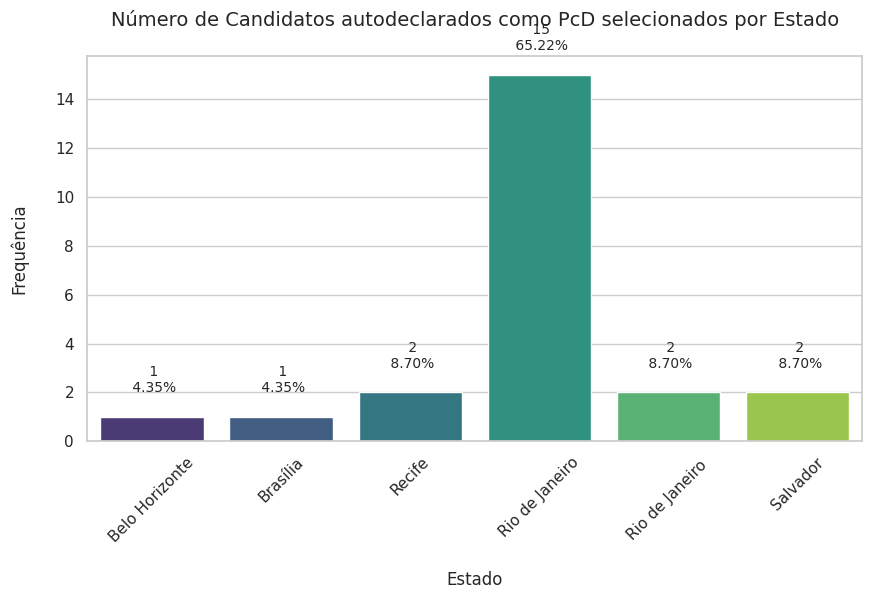

In [232]:
# Função para verificar se o candidato não é PcD
def nao_pcd(row):
    return row["vagas_pcd"] != "S"

# Criar uma nova coluna aplicando a função
selecionados["nao_pcd"] = selecionados.apply(nao_pcd, axis=1)

# Filtrar apenas os candidatos PcD selecionados
pcd_selecionados = selecionados[selecionados["nao_pcd"] == False]

# Contar o número de candidatos PcD selecionados por estado
pcd_por_estado = pcd_selecionados.groupby('estado').size()

# Calcular o total de candidatos PcD selecionados
total_pcd_selecionados = len(pcd_selecionados)

# Calcular percentuais de candidatos PcD selecionados por estado
percentuais_pcd_por_estado = (pcd_por_estado / total_pcd_selecionados) * 100

# Plotar o gráfico de barras
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=pcd_por_estado.index, y=pcd_por_estado.values, palette="viridis")
plt.xlabel("\nEstado", fontsize=12)
plt.ylabel("Frequência\n", fontsize=12)
plt.title("Número de Candidatos autodeclarados como PcD selecionados por Estado\n", fontsize=14)
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(pcd_por_estado.values):
    percentual = percentuais_pcd_por_estado[i]
    ax.text(i, valor + 1, f' {valor}\n {percentual:.2f}%', ha='center', size=10)

plt.show()

##### Distribuição das notas dos candidatos

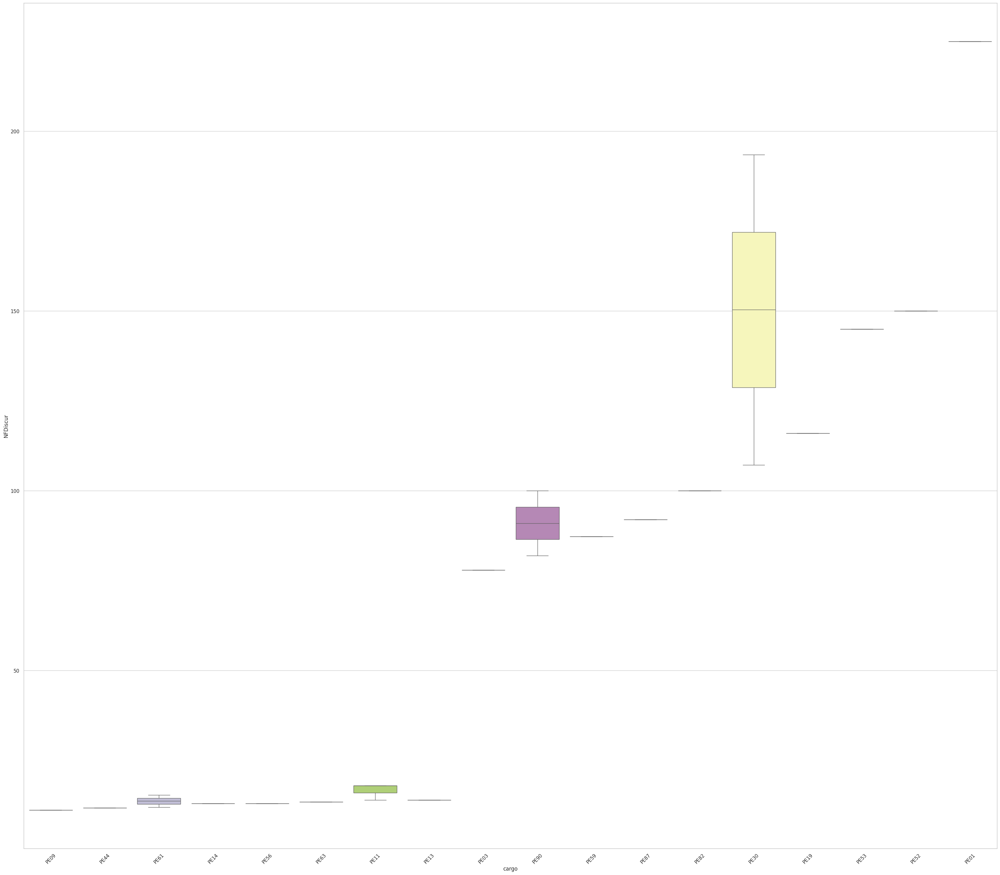

In [234]:
# Filtrar os dados para selecionados PcD
selecionados_PCD = selecionados[(selecionados['vagas_pcd'] == 'S') & (selecionados['Habilitado'] == 'Sim')]

# Ordenar os dados pelo valor de NFDiscur
selecionados_PCD = selecionados_PCD.sort_values(by='NFDiscur')

# Criar o boxplot com os dados filtrados
fig = plt.figure(figsize=(40, 35))
sns.boxplot(x="cargo", y="NFDiscur", data=selecionados_PCD, palette="Set3", order=selecionados_PCD['cargo'].unique())

# Rotacionar os rótulos do eixo x para melhor visualização
plt.xticks(rotation=45)

plt.show()

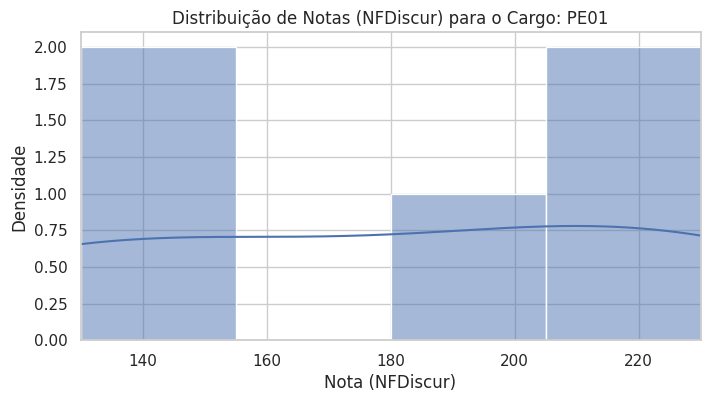

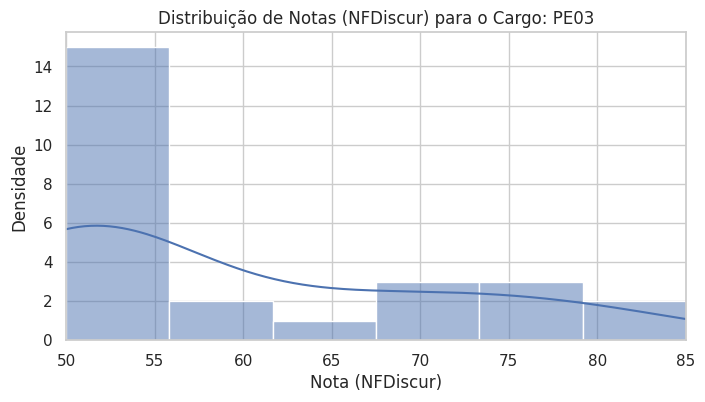

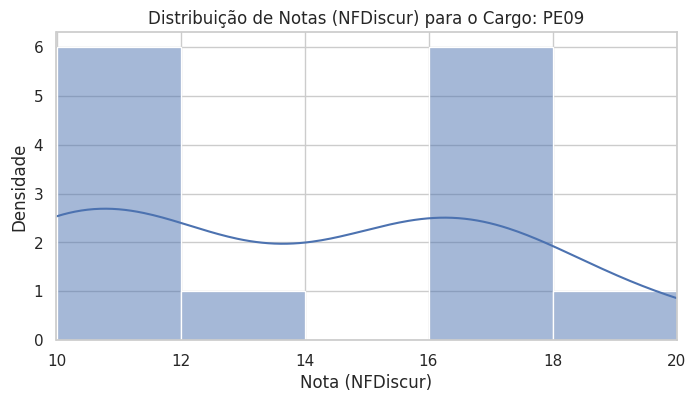

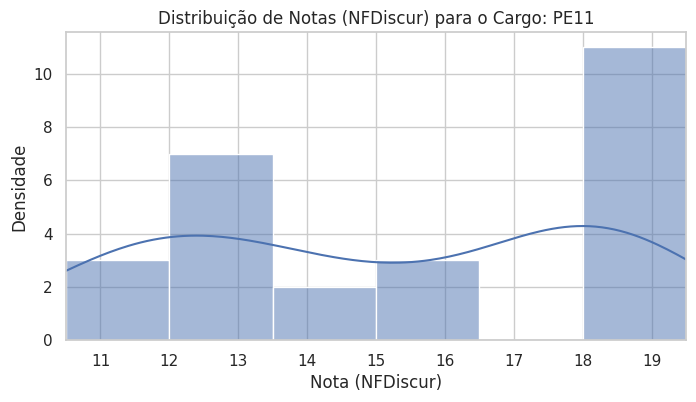

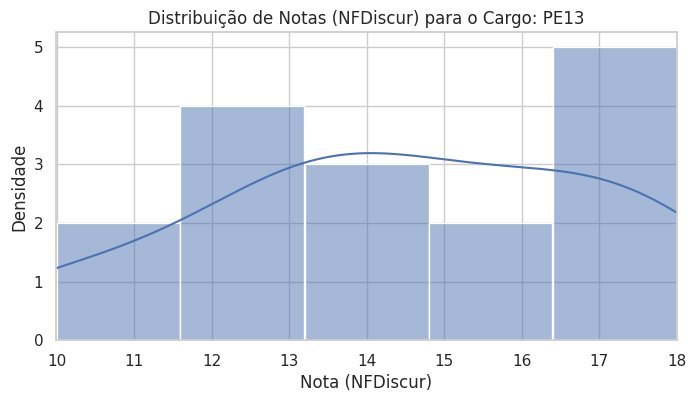

...

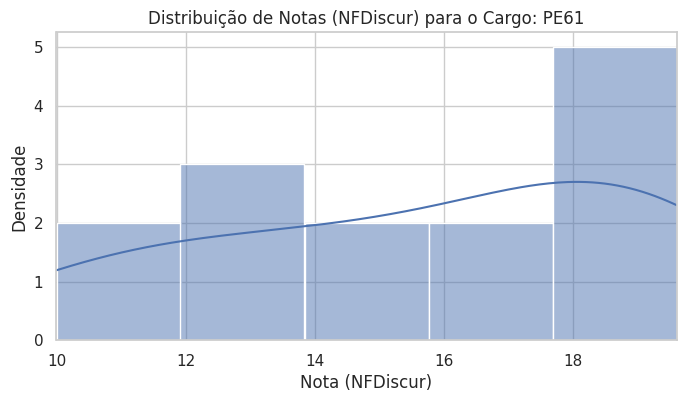

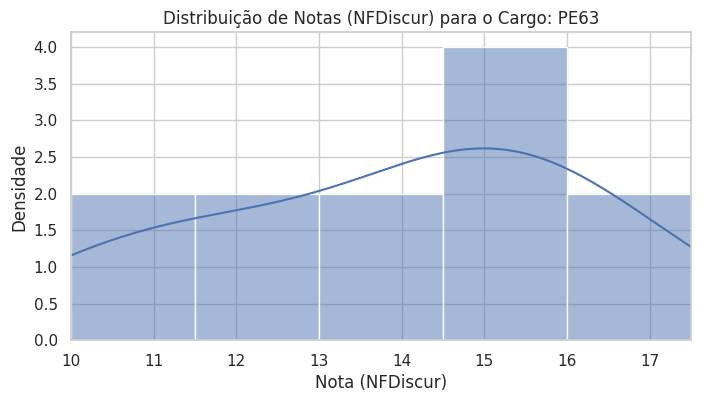

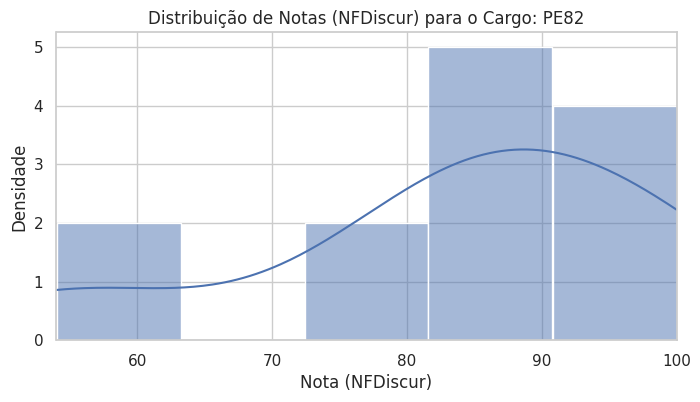

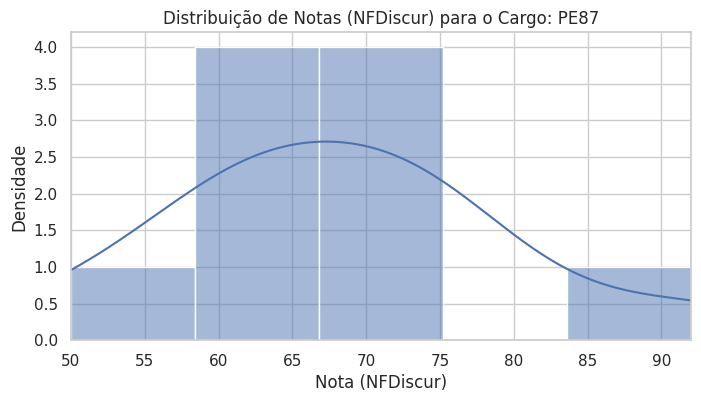

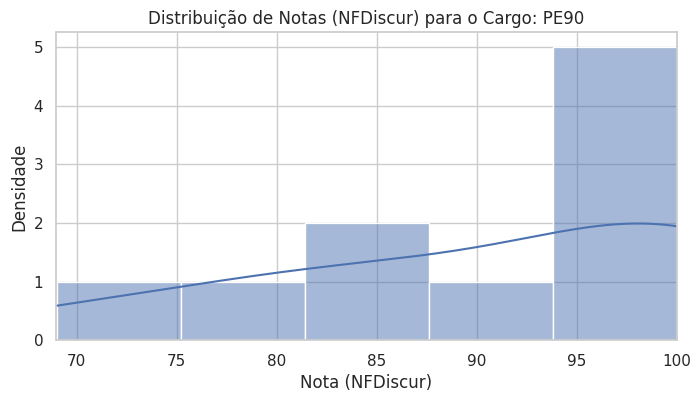

In [235]:
# Filtrar os dados para cargos onde existam vagas específicas para PcD
cargos_unicos = selecionados[selecionados['vagas_pcd'] == 'S']['cargo'].unique()

# Loop através de cada cargo
for cargo in cargos_unicos[:39]:  # Limitando a 39 cargos
    # Filtrar o DataFrame para o cargo atual
    dados_cargo = selecionados[(selecionados['cargo'] == cargo) & (selecionados['Habilitado'] == 'Sim')]

    # Encontre os limites dos eixos x para o cargo atual
    min_value = dados_cargo['NFDiscur'].min()
    max_value = dados_cargo['NFDiscur'].max()

    # Configure a figura e o subplot
    plt.figure(figsize=(8, 4))

    # Criar um gráfico de distribuição para o cargo atual
    sns.histplot(dados_cargo['NFDiscur'], kde=True)

    # Adicione título ao subplot
    plt.title(f'Distribuição de Notas (NFDiscur) para o Cargo: {cargo}')

    # Adicione rótulos aos eixos
    plt.xlabel('Nota (NFDiscur)')
    plt.ylabel('Densidade')

    # Defina os limites dos eixos x
    plt.xlim(min_value, max_value)

    # Mostre o gráfico
    plt.show()

#### Distribuição dos candidatos não autodeclarados como negros ou PcD por cargo

##### Distribuição dos candidatos por cargo

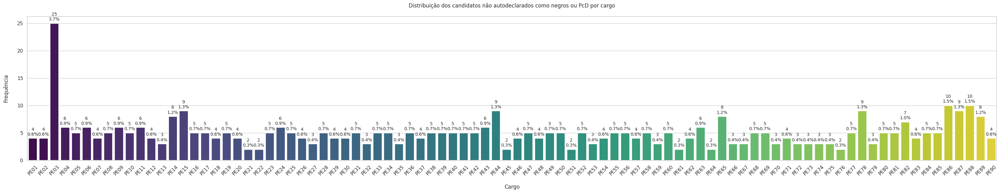

In [236]:
# Filtrar os dados para os casos em que os candidatos são selecionados para correção da prova discursiva
selecionados = df_disc[df_disc["Habilitado"] == "Sim"]

# Função para verificar se o candidato não é PcD ou não é autodeclarado negro
def nao_pcd_nao_negro(row):
    return (row["vagas_pcd"] != "S") and (row["vagas_negros"] != "S")

# Criar uma nova coluna aplicando a função
selecionados["nao_pcd_nao_negro"] = selecionados.apply(nao_pcd_nao_negro, axis=1)

# Obter os cargos onde há inscritos que não são PcD nem autodeclarados negros
cargos_sem_pcd_nem_negros = selecionados[selecionados["nao_pcd_nao_negro"] == True]["cargo"].value_counts()

# Ordenar os cargos alfabeticamente
cargos_sem_pcd_nem_negros = cargos_sem_pcd_nem_negros.sort_index()

# Plotar o gráfico de barras
plt.figure(figsize=(40, 6))
ax = sns.barplot(x=cargos_sem_pcd_nem_negros.index, y=cargos_sem_pcd_nem_negros.values, palette="viridis")
plt.xlabel("\nCargo")
plt.ylabel("Frequência\n")
plt.title("Distribuição dos candidatos não autodeclarados como negros ou PcD por cargo\n")
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(cargos_sem_pcd_nem_negros.values):
    total = valor
    percentual = (valor / len(selecionados)) * 100
    ax.text(i, valor + 0.5, f'{total}\n{percentual:.1f}%', ha='center', size=10)

plt.show()

##### Distribuição dos candidatos por estado

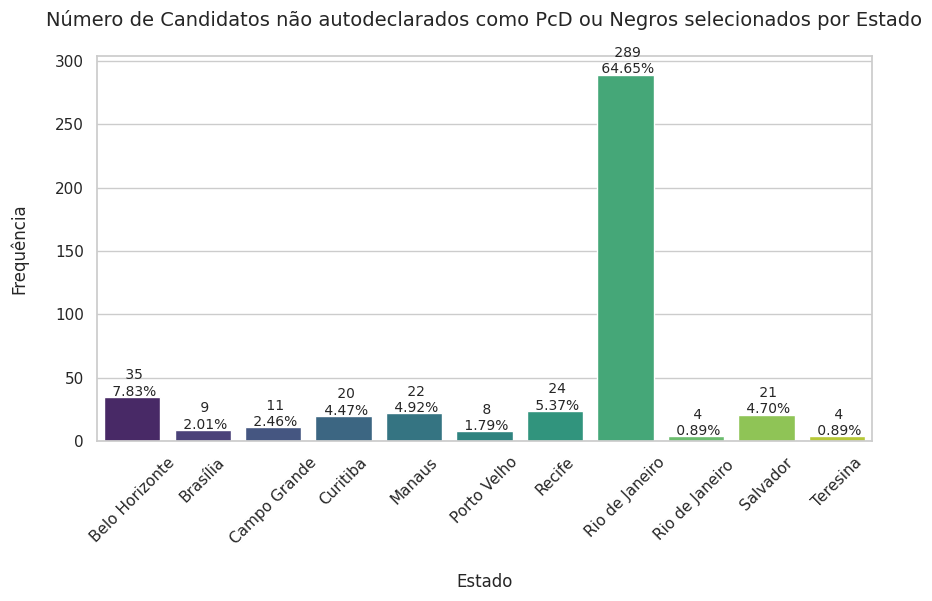

In [237]:
# Filtrar os dados para os casos em que os candidatos são selecionados para correção da prova discursiva
selecionados = df_disc[df_disc["Habilitado"] == "Sim"]

# Função para verificar se o candidato não é PcD ou não é negro
def nao_pcd_nao_negro(row):
    return (row["vagas_pcd"] != "S") and (row["vagas_negros"] != "S")

# Criar uma nova coluna aplicando a função
selecionados["nao_pcd_nao_negro"] = selecionados.apply(nao_pcd_nao_negro, axis=1)

# Filtrar os candidatos que não são PcD nem autodeclarados negros
candidatos_sem_pcd_nem_negros = selecionados[selecionados["nao_pcd_nao_negro"] == True]

# Contar o número de candidatos não PcD nem negros selecionados por estado
outros_por_estado = candidatos_sem_pcd_nem_negros.groupby('estado').size()

# Calcular o total de candidatos não PcD nem autodeclarados negros
total_outros_selecionados = len(candidatos_sem_pcd_nem_negros)

# Calcular percentuais de candidatos não PcD nem autodeclarados negros selecionados por estado
percentuais_outros_por_estado = (outros_por_estado / total_outros_selecionados) * 100

# Plotar o gráfico de barras
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=outros_por_estado.index, y=outros_por_estado.values, palette="viridis")
plt.xlabel("\nEstado", fontsize=12)
plt.ylabel("Frequência\n", fontsize=12)
plt.title("Número de Candidatos não autodeclarados como PcD ou Negros selecionados por Estado\n", fontsize=14)
plt.xticks(rotation=45)  # Rotaciona os rótulos do eixo x para facilitar a leitura

# Adicionar o total e o percentual acima de cada barra
for i, valor in enumerate(outros_por_estado.values):
    percentual = percentuais_outros_por_estado[i]
    ax.text(i, valor + 1, f' {valor}\n {percentual:.2f}%', ha='center', size=10)

plt.show()

##### Distribuição das notas dos candidatos

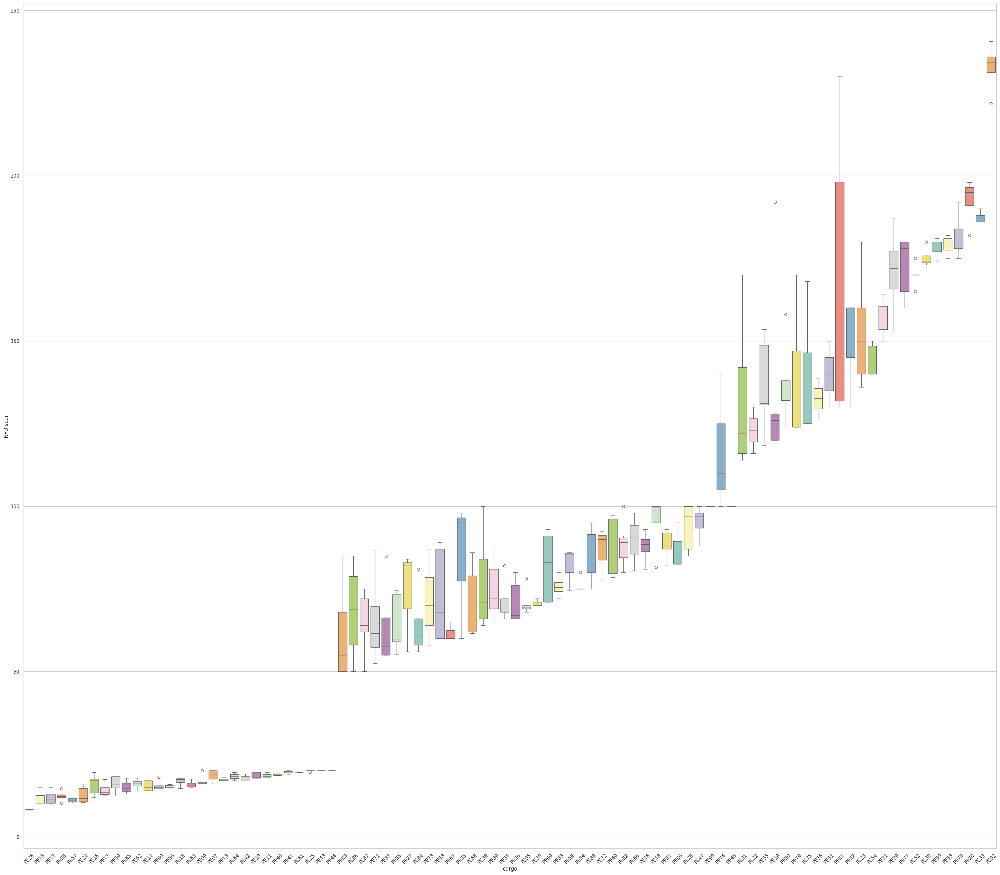

In [241]:
# Filtrar os dados para selecionados PcD
selecionados_nao_negros_nao_pcd = selecionados[(selecionados['vagas_negros'] != 'S') &
                                                (selecionados['vagas_pcd'] != 'S') &
                                                (selecionados['Habilitado'] == 'Sim')]

# Ordenar os dados pelo valor de NFDiscur
selecionados_nao_negros_nao_pcd = selecionados_nao_negros_nao_pcd.sort_values(by='NFDiscur')

# Criar o boxplot com os dados filtrados
fig = plt.figure(figsize=(40, 35))
sns.boxplot(x="cargo", y="NFDiscur", data=selecionados_nao_negros_nao_pcd, palette="Set3", order=selecionados_nao_negros_nao_pcd['cargo'].unique())

# Rotacionar os rótulos do eixo x para melhor visualização
plt.xticks(rotation=45)

plt.show()

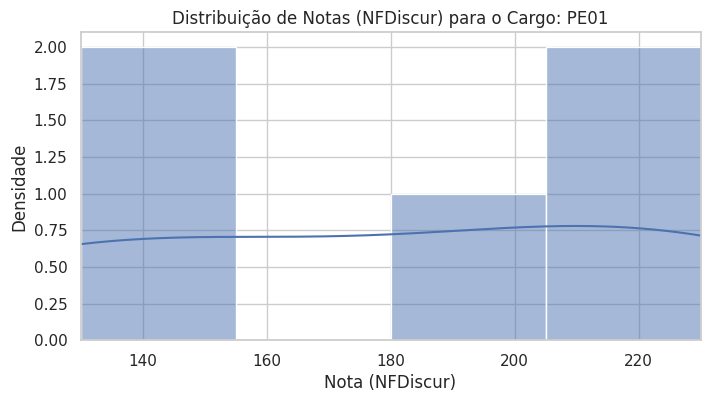

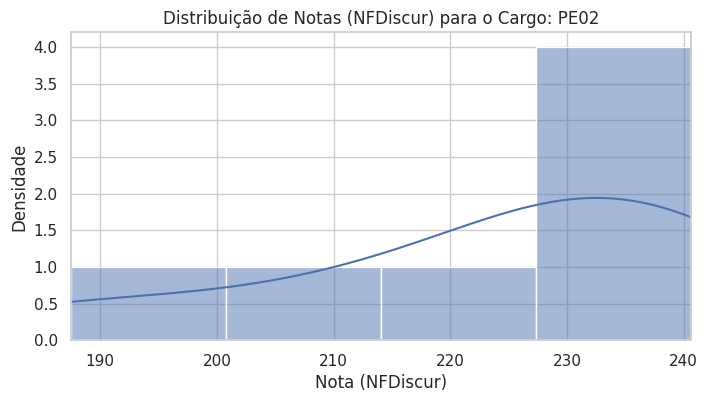

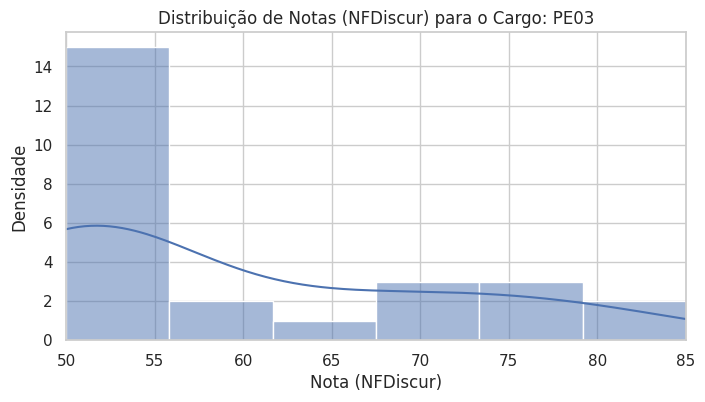

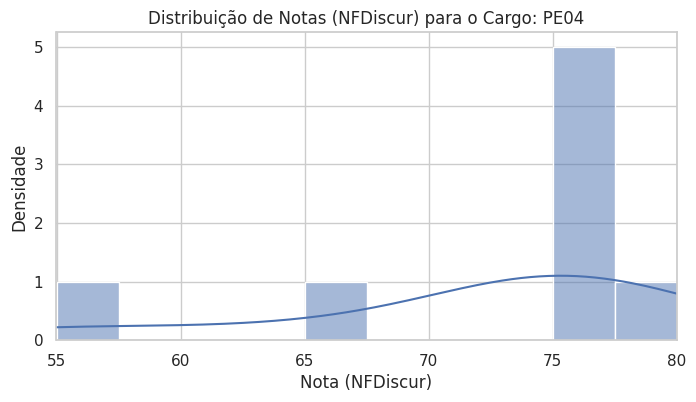

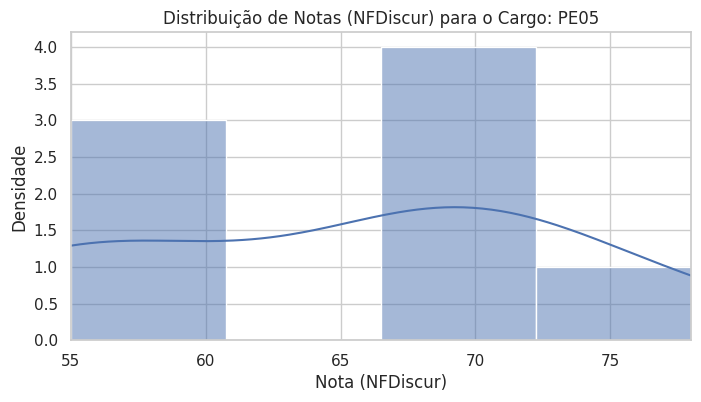

...

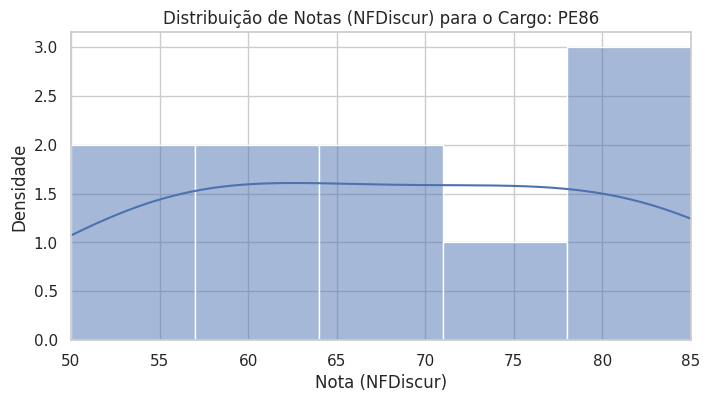

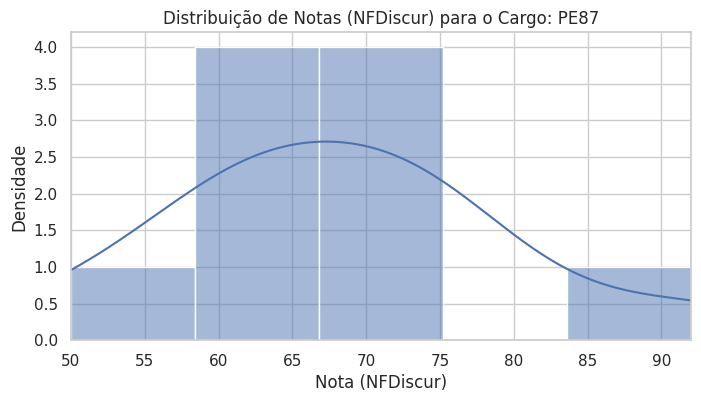

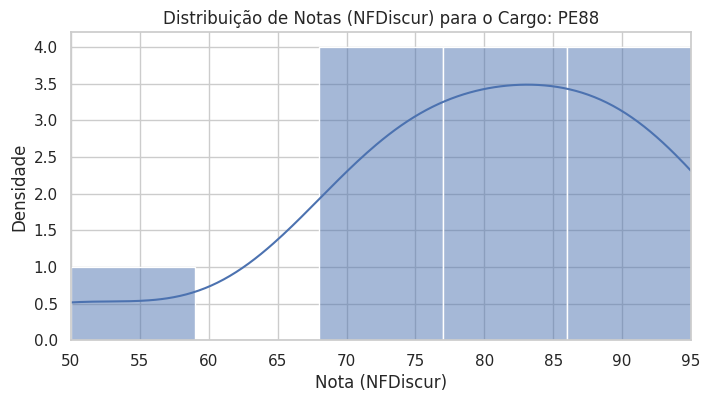

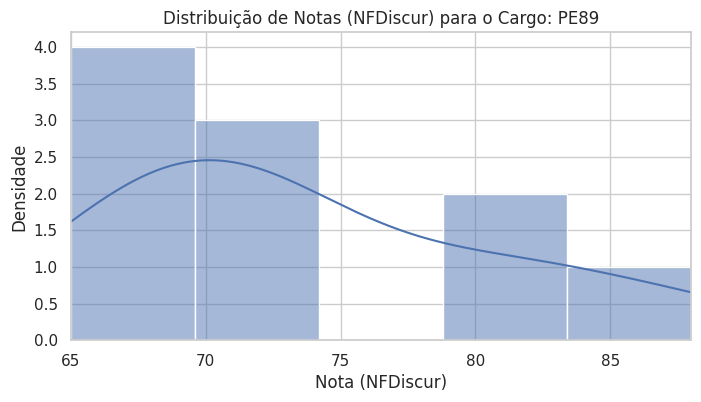

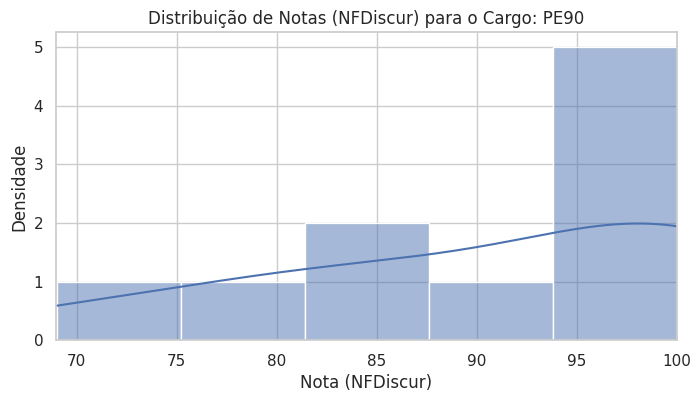

In [242]:
# Filtrar os dados para cargos onde não existam vagas específicas para autodeclarados negros ou PCDs
cargos_unicos = selecionados[(selecionados['vagas_negros'] != 'S') & (selecionados['vagas_pcd'] != 'S')]['cargo'].unique()

# Loop através de cada cargo
for cargo in cargos_unicos[:90]:  # Limitando a 90 cargos
    # Filtrar o DataFrame para o cargo atual
    dados_cargo = selecionados[(selecionados['cargo'] == cargo) & (selecionados['Habilitado'] == 'Sim')]

    # Encontre os limites dos eixos x para o cargo atual
    min_value = dados_cargo['NFDiscur'].min()
    max_value = dados_cargo['NFDiscur'].max()

    # Configure a figura e o subplot
    plt.figure(figsize=(8, 4))

    # Criar um gráfico de distribuição para o cargo atual
    sns.histplot(dados_cargo['NFDiscur'], kde=True)

    # Adicione título ao subplot
    plt.title(f'Distribuição de Notas (NFDiscur) para o Cargo: {cargo}')

    # Adicione rótulos aos eixos
    plt.xlabel('Nota (NFDiscur)')
    plt.ylabel('Densidade')

    # Defina os limites dos eixos x
    plt.xlim(min_value, max_value)

    # Mostre o gráfico
    plt.show()

# CONCLUSÕES

Aguardando o término da 2ª e 3ª Fase.